# 0. Environment

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

# 1. Getting the FSD Dataset


In [ ]:
!wget https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z01
!wget https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z02
!wget https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z03
!wget https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z04
!wget https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z05
!wget https://zenodo.org/record/4060432/files/FSD50K.dev_audio.zip
!zip -s 0 FSD50K.dev_audio.zip --out unsplit.zip
!unzip unsplit.zip


In [ ]:
!wget https://zenodo.org/record/4060432/files/FSD50K.eval_audio.z01
!wget https://zenodo.org/record/4060432/files/FSD50K.eval_audio.zip
!zip -s 0 /content/FSD50K.eval_audio.zip --out unsplit.zip
!unzip unsplit.zip

In [ ]:
### Start the downloads in the background, in parallel
import subprocess
import threading
from datetime import datetime

download_eval = True
download_dev = True

commands = []
if download_eval:
  commands.append(['wget', 'https://zenodo.org/record/4060432/files/FSD50K.eval_audio.z01'])
  commands.append(['wget', 'https://zenodo.org/record/4060432/files/FSD50K.eval_audio.zip'])

if download_dev:
  commands.append(['wget', 'https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z01'])
  commands.append(['wget', 'https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z02'])
  commands.append(['wget', 'https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z03'])
  commands.append(['wget', 'https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z04'])
  commands.append(['wget', 'https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z05'])
  commands.append(['wget', 'https://zenodo.org/record/4060432/files/FSD50K.dev_audio.zip'])

def run_command(command):
    subprocess.run(command)

threads = []
for cmd in commands:
    t = threading.Thread(target=run_command, args=(cmd,))
    t.start()
    threads.append(t)

# If you want the main thread to wait for all threads to complete:
#for t in threads:
#  print("joining...")
#  t.join()
#  print("...ok")


In [ ]:
import requests
import requests
import os
from concurrent.futures import ThreadPoolExecutor

def download_file(url, dest_folder):
  """
  Downloads a file from a given URL and saves it to a destination folder.

  Args:
  - url (str): The URL of the file to download.
  - dest_folder (str): The destination folder where the file should be saved.
  """
  if not os.path.exists(dest_folder):
    os.makedirs(dest_folder)

  response = requests.get(url, stream=True)
  filename = os.path.join(dest_folder, url.split('/')[-1])

  with open(filename, 'wb') as file:
    for chunk in response.iter_content(chunk_size=8192):
      file.write(chunk)

  return filename  # return the saved file path

def download_files_in_parallel(url_list, dest_folder):
  """
  Downloads files from a list of URLs in parallel and saves them to a destination folder.

  Args:
  - url_list (list): List of URLs to download.
  - dest_folder (str): The destination folder where files should be saved.

  Returns:
  - list: List of saved file paths.
  """
  with ThreadPoolExecutor() as executor:
    return list(executor.map(download_file, url_list, [dest_folder] * len(url_list)))

download_eval = True
download_dev = True

urls = []
if download_eval:
  urls.append('https://zenodo.org/record/4060432/files/FSD50K.eval_audio.z01')
  urls.append('https://zenodo.org/record/4060432/files/FSD50K.eval_audio.zip')

if download_dev:
  urls.append('https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z01')
  urls.append('https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z02')
  urls.append('https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z03')
  urls.append('https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z04')
  urls.append('https://zenodo.org/record/4060432/files/FSD50K.dev_audio.z05')
  urls.append('https://zenodo.org/record/4060432/files/FSD50K.dev_audio.zip')

downloaded_files = download_files_in_parallel(urls, "/content/")
print(downloaded_files)


['/content/FSD50K.eval_audio.z01', '/content/FSD50K.eval_audio.zip', '/content/FSD50K.dev_audio.z01', '/content/FSD50K.dev_audio.z02', '/content/FSD50K.dev_audio.z03', '/content/FSD50K.dev_audio.z04', '/content/FSD50K.dev_audio.z05', '/content/FSD50K.dev_audio.zip']


In [ ]:
!ls -ltrh --full-time
!date "+%Y-%m-%d %H:%M:%S.%3N"


total 29M
drwxr-xr-x 1 root root 4.0K 2023-08-15 13:37:24.000000000 +0000 sample_data
drwx------ 5 root root 4.0K 2023-08-16 20:24:22.000000000 +0000 drive
-rw------- 1 root root  24M 2023-08-16 20:24:24.948556530 +0000 dev_audio_metadata.json
-rw------- 1 root root 5.8M 2023-08-16 20:24:26.284645030 +0000 eval_audio_metadata.json
drwxr-xr-x 2 root root 4.0K 2023-08-16 20:50:45.194236231 +0000 downloaded_files
2023-08-16 21:10:45.454


In [ ]:
import subprocess
import time

def get_modification_time(filename):
    # Get the file's modification time using 'ls --full-time'
    result = subprocess.run(["ls", "--full-time", filename], capture_output=True, text=True)
    output = result.stdout
    #print(output)
    # Split the output and extract the modification time
    mod_time = output.split()[6]
    return mod_time

In [ ]:
get_modification_time('FSD50K.eval_audio.zip')

'20:27:41.861604236'

In [ ]:
get_modification_time('FSD50K.dev_audio.zip')

'14:51:49.035584160'

In [ ]:
def file_done_downloading(filename, unchanged_duration=11):
    """
    Peek at the file for a specified duration to see if it's being modified.

    :param filename: File to monitor
    :param unchanged_duration: Duration (in seconds) to monitor the file
    :return: True if file was modified during the duration, False otherwise
    """
    last_mod_time = get_modification_time(filename)
    end_time = time.time() + unchanged_duration

    while time.time() < end_time:
      current_mod_time = get_modification_time(filename)
      if last_mod_time != current_mod_time:
        return False  # File was modified

      last_mod_time = current_mod_time
      time.sleep(1)  # Check every 2 seconds. Adjust as needed

    return True  # File was not modified during the duration

In [ ]:
if file_done_downloading('FSD50K.eval_audio.zip') and file_done_downloading('FSD50K.eval_audio.z01'):
  print("eval audio done downloading")
else:
  print("eval audio still downloading")

eval audio still downloading


In [ ]:
import os
def get_filesize_mb(filename):
  """
  Returns the size of the file in megabytes (MB).

  Args:
  - filename (str): Path to the file.

  Returns:
  - float: Size of the file in MB.
  """
  size_in_bytes = os.path.getsize(filename)
  return size_in_bytes / (1024 ** 2)

In [ ]:
# block until eval is downloaded:
fn1 = 'FSD50K.eval_audio.zip.1'
fn2 = 'FSD50K.eval_audio.z01.1'
while not (file_done_downloading(fn1) and file_done_downloading(fn2)):
  now = datetime.now()
  date_time = now.strftime("%m-%d-%y_%H:%M:%S")
  sz1 = get_filesize_mb(fn1)
  sz2 = get_filesize_mb(fn2)
  print(f"still downloading at {date_time}; {fn1}size {sz1:.3f}MB, 'FSD50K.eval_audio.z01' {sz2:.3f}MB")
  time.sleep(1)

now = datetime.now()
date_time = now.strftime("%m-%d-%y_%H:%M:%S")
print(f"eval done at {date_time}")

eval done at 08-16-23_20:44:26


In [ ]:
# decompress the eval set:
!zip -s 0 /content/FSD50K.eval_audio.zip --out unsplit.zip
!unzip unsplit.zip

Streaming output truncated to the last 5000 lines.
  inflating: FSD50K.eval_audio/109820.wav  
  inflating: FSD50K.eval_audio/323793.wav  
  inflating: FSD50K.eval_audio/18366.wav  
  inflating: FSD50K.eval_audio/365102.wav  
  inflating: FSD50K.eval_audio/64620.wav  
  inflating: FSD50K.eval_audio/172858.wav  
  inflating: FSD50K.eval_audio/250098.wav  
  inflating: FSD50K.eval_audio/171973.wav  
  inflating: FSD50K.eval_audio/402569.wav  
  inflating: FSD50K.eval_audio/189620.wav  
  inflating: FSD50K.eval_audio/137894.wav  
  inflating: FSD50K.eval_audio/390340.wav  
  inflating: FSD50K.eval_audio/405267.wav  
  inflating: FSD50K.eval_audio/135848.wav  
  inflating: FSD50K.eval_audio/369598.wav  
  inflating: FSD50K.eval_audio/110584.wav  
  inflating: FSD50K.eval_audio/97756.wav  
  inflating: FSD50K.eval_audio/236294.wav  
  inflating: FSD50K.eval_audio/369265.wav  
  inflating: FSD50K.eval_audio/93790.wav  
  inflating: FSD50K.eval_audio/344679.wav  
  inflating: FSD50K.eval_audi

In [ ]:
if file_done_downloading('FSD50K.dev_audio.zip') and file_done_downloading('FSD50K.dev_audio.z01') and file_done_downloading('FSD50K.dev_audio.z02') and file_done_downloading('FSD50K.dev_audio.z03') and file_done_downloading('FSD50K.dev_audio.z04') and file_done_downloading('FSD50K.dev_audio.z05'):
  print("dev audio done downloading")
else:
  print("dev audio still downloading")

dev audio still downloading


In [ ]:
# block until dev is downloaded:
while not (file_done_downloading('FSD50K.dev_audio.zip') and file_done_downloading('FSD50K.dev_audio.z01') and file_done_downloading('FSD50K.dev_audio.z02') and file_done_downloading('FSD50K.dev_audio.z03') and file_done_downloading('FSD50K.dev_audio.z04') and file_done_downloading('FSD50K.dev_audio.z05')):
  now = datetime.now()
  date_time = now.strftime("%m-%d-%y_%H:%M:%S")
  print(f"still downloading at {date_time}")
  time.sleep(1)

now = datetime.now()
date_time = now.strftime("%m-%d-%y_%H:%M:%S")
print(f"dev done at {date_time}")


dev done at 08-14-23_15:00:00


In [ ]:
# decompress dev audio
!zip -s 0 /content/FSD50K.dev_audio.zip --out unsplit.zip
!unzip unsplit.zip

Streaming output truncated to the last 5000 lines.
  inflating: FSD50K.dev_audio/256339.wav  
  inflating: FSD50K.dev_audio/182395.wav  
  inflating: FSD50K.dev_audio/138791.wav  
  inflating: FSD50K.dev_audio/373663.wav  
  inflating: FSD50K.dev_audio/273192.wav  
  inflating: FSD50K.dev_audio/100332.wav  
  inflating: FSD50K.dev_audio/68954.wav  
  inflating: FSD50K.dev_audio/140891.wav  
  inflating: FSD50K.dev_audio/337503.wav  
  inflating: FSD50K.dev_audio/126304.wav  
  inflating: FSD50K.dev_audio/75270.wav  
  inflating: FSD50K.dev_audio/96626.wav  
  inflating: FSD50K.dev_audio/79748.wav  
  inflating: FSD50K.dev_audio/247730.wav  
  inflating: FSD50K.dev_audio/27657.wav  
  inflating: FSD50K.dev_audio/255252.wav  
  inflating: FSD50K.dev_audio/82678.wav  
  inflating: FSD50K.dev_audio/329894.wav  
  inflating: FSD50K.dev_audio/77543.wav  
  inflating: FSD50K.dev_audio/375042.wav  
  inflating: FSD50K.dev_audio/381503.wav  
  inflating: FSD50K.dev_audio/373669.wav  
  inflatin

# 2. SegSep



In [ ]:
!pip install torchaudio
!pip install torchinfo
!pip install essentia

!pip install -q git+https://github.com/BenjaminOlsen/SegSep.git
!pip install -q git+https://github.com/huggingface/transformers.git

!pip install mir_eval # todo! switch to museval


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.7/13.7 MB 8.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 70.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 65.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.7/90.7 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for mir_eval: filename=mir_eval-0.7-py3-none-any.whl size=100704 sha256=b6b4b9cbd23e85659bd503f409669b1fb0309916531d9a65203ac3c5cc1923ae
  Stored in directory: /root/.cache/pip/wheels/3e/2f/0d/dda9c4c77a170e21356b6afa2f7d9bb078338634ba05d94e3f
Successfully built mir_eval


In [ ]:
import pytz
import torch
import random
import segsep
import torchaudio
import importlib
import numpy as np
import essentia.standard as es
import matplotlib.pyplot as plt

from statistics import mean
from google.colab import drive
from torchinfo import summary
from datetime import datetime

from segsep.utils import print_tensor_stats, calculate_energy, spectral_centroid_waveform, should_skip_chunk
from segsep.datasets import AudioPairDataset, generate_audio_metadata
from segsep.loss_acc import LOGL2loss_freq, si_snr, L2loss_freq, L1loss_freq, LOGL1loss_freq
from segsep.train_validate import train, validate
from segsep.sam_sep import SamWrapper
from segsep.train_sam_image_encoder import run_train_validate

from mir_eval.separation import bss_eval_sources #todo: switch to museval

In [ ]:
!ls -ltrh

total 237M
drwxr-xr-x 1 root root 4.0K Aug 15 13:37 sample_data
-rw-r--r-- 1 root root  30M Aug 16 20:23 FSD50K.eval_audio.zip
-rw-r--r-- 1 root root  31M Aug 16 20:23 FSD50K.dev_audio.z05
-rw-r--r-- 1 root root  30M Aug 16 20:23 FSD50K.dev_audio.z02
-rw-r--r-- 1 root root  29M Aug 16 20:23 FSD50K.eval_audio.z01
-rw-r--r-- 1 root root  30M Aug 16 20:23 FSD50K.dev_audio.z03
-rw-r--r-- 1 root root  30M Aug 16 20:23 FSD50K.dev_audio.zip
-rw-r--r-- 1 root root  30M Aug 16 20:23 FSD50K.dev_audio.z04
-rw-r--r-- 1 root root  30M Aug 16 20:23 FSD50K.dev_audio.z01


In [ ]:
#################################################################################
#################################################################################
#################################################################################
# Run this cell only to reload segsep module, if segsep has been updated in git #
#################################################################################
#################################################################################
################################################################################$
import importlib

!pip uninstall -y SegSep
!pip install -q git+https://github.com/BenjaminOlsen/SegSep.git
importlib.reload(segsep.utils)
importlib.reload(segsep.datasets)
importlib.reload(segsep.loss_acc)
importlib.reload(segsep.train_validate)
importlib.reload(segsep.sam_sep)
importlib.reload(segsep.train_sam_image_encoder)
from segsep.utils import print_tensor_stats, calculate_energy, spectral_centroid_waveform
from segsep.datasets import AudioPairDataset, generate_audio_metadata
from segsep.loss_acc import LOGL2loss_freq, si_snr, L2loss_freq, L1loss_freq, LOGL1loss_freq
from segsep.train_validate import train, validate
from segsep.sam_sep import SamWrapper
from segsep.train_sam_image_encoder import run_train_validate


Found existing installation: segsep 0.0.1
Uninstalling segsep-0.0.1:
  Successfully uninstalled segsep-0.0.1
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

In [ ]:
!cp /content/drive/MyDrive/dev_audio_metadata.json .
!cp /content/drive/MyDrive/eval_audio_metadata.json .

For the STFT to result in a tensor of precisely spec_dim shape, with `spec_dim[0]` time frames and `spec_dim[1]` frequency bins then the following must be true:

With `center=True` for the stft, each of the input audio is padded such that the kth frame is centered at index `k*hop_len` samples. Therefore, to have precisely `spec_len[0]` frames, the last sample should have index value `(spec_len[0]-1)`, so the audio length input to the STFT must be equal to `(spec_len[0]-1)*hop_len`.

(Conversely, the time bin of the corresponding

This input to the STFT is the *output* of the downsampler, so if we have a downsampling ratio of `ρ`, and an input audio sample count of `chunk_size`, then the number of samples in the downsampled audio is `chunk_size / ρ`, which must be equal to `(spec_len[0]-1)*hop_len`

For real valued signals, the FFT is symetrical, and returns only the values for `ω` in `[0, 1, ... n_fft//2 + 1]` Therefore `n_fft = 2 * (spec_dim[1] - 1)`

---

In a blind, zero-shot setting SAM doesn't seem to generalize very well to audio. It seems to attempt to group obvious visual features together, but stumbles on the general spectral mixing that sound exhibits. This is, perhaps, the main difficulty of applying semantic segmentation models to sound: in those datasets, there is typically one class outcome per pixel of the output segmentation map. Indeed, there are probabilities* generated for each output class, which are then thresholded in order to producce the final map, but the cost is calculated (SAUCE - DOUBLE CHECK THIS) using cross-entropy loss

In [ ]:
model = SamWrapper(spec_dim=(256,256),
                   sample_rate=44100,
                   resample_rate=22050,
                   saved_model_state_dict=None).to(device)

SamWrapper model n_fft: 510, win len: 510, hop len: 63, sample/resample: 2.0 -> input_chunk_size 32130.0


In [ ]:
summary(model=model,
        input_size=(3, model.input_chunk_size),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                                     Input Shape          Output Shape         Param #              Trainable
SamWrapper (SamWrapper)                                                     [3, 32130]           [3, 32130]           --                   True
├─Resample (downsampler)                                                    [3, 32130]           [3, 16065]           --                   --
├─SamModel (sam_model)                                                      --                   [1, 1, 3, 256, 256]  --                   True
│    └─SamPromptEncoder (prompt_encoder)                                    --                   --                   (recursive)          True
│    │    └─SamPositionalEmbedding (shared_embedding)                       [64, 64, 2]          [64, 64, 256]        --                   --
│    └─SamVisionEncoder (vision_encoder)                                    [1, 3, 1024, 1024]   [1, 256, 64, 64]     3,145,728        

In [ ]:
import os
def walk_through_dir(dir_path):
  """
  Walks through dir_path returning its contents.
  Args:
    dir_path (str or pathlib.Path): target directory

  Returns:
    A print out of:
      number of subdiretories in dir_path
      number of images (files) in each subdirectory
      name of each subdirectory
  """
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} files in '{dirpath}'.")

In [ ]:
# copy the metadata json (takes a while to calculate otherwise)
!cp -v /content/drive/MyDrive/eval_audio_metadata.json .
!cp -v /content/drive/MyDrive/dev_audio_metadata.json .

NotImplementedError: ignored

In [ ]:
walk_through_dir('/content/FSD50K.eval_audio')


In [ ]:
walk_through_dir('/content/FSD50K.dev_audio')

In [ ]:
#fsd_location = '/content/drive/MyDrive/FSD50K/FSD50K.eval_audio'
fsd_eval_location = '/content/FSD50K.eval_audio'
eval_metadata_json = '/content/eval_audio_metadata.json'
fsd_dev_location = '/content/FSD50K.dev_audio'
dev_metadata_json = '/content/dev_audio_metadata.json'

walk_through_dir(fsd_dev_location)
walk_through_dir(fsd_eval_location)


There are 0 directories and 40966 files in '/content/FSD50K.dev_audio'.
There are 0 directories and 10231 files in '/content/FSD50K.eval_audio'.


In [ ]:
!cp -rv /content/drive/MyDrive/FSD50K/FSD50K.dev_audio .
!cp -rv /content/drive/MyDrive/FSD50K/FSD50K.eval_audio .

!cp -rv /content/drive/MyDrive/FSD50K/FSD50K.dev_audio . && cp -rv /content/drive/MyDrive/FSD50K/FSD50K.eval_audio .

In [ ]:
generate_audio_metadata(fsd_eval_location, eval_metadata_json, verbose=True)

In [ ]:
!cp '/content/eval_audio_metadata.json' '/content/drive/MyDrive/'

In [ ]:
generate_audio_metadata(fsd_dev_location, dev_metadata_json, verbose=True)

In [ ]:
!cp '/content/dev_audio_metadata.json' '/content/drive/MyDrive/'

In [ ]:
def max_min_mean_std(arr):
  return np.max(arr), np.min(arr), np.mean(arr), np.std(arr)

In [ ]:
import json
## checking out the metadata
with open(eval_metadata_json, 'r') as f:
  eval_metadata = json.load(f)

with open(dev_metadata_json, 'r') as f:
  dev_metadata = json.load(f)

idx = random.randint(0, len(dev_metadata))
dev_metadata[idx]

{'filename': '55059.wav',
 'sample_cnt': 349056,
 'sample_rate': 44100,
 'spectral_centroid': {'max': 4141.740087674064,
  'min': 1069.7817306295728,
  'mean': 2206.47847664812,
  'std': 615.0282890135584},
 'spectral_bandwidth': {'max': 5224.60646298643,
  'min': 1690.1770191657267,
  'mean': 3757.227468457359,
  'std': 471.421015837162},
 'spectral_flatness': {'max': 0.38372015953063965,
  'min': 0.04339533671736717,
  'mean': 0.19143481785157584,
  'std': 0.05453046296350153},
 'spectral_contrast': {'max': -0.6980741024017334,
  'min': -0.9267587065696716,
  'mean': -0.773736412165796,
  'std': 0.022233658845826385}}

In [ ]:
len(dev_metadata)

40966

In [ ]:
metadata = eval_metadata

num_entries = len(metadata)
print(f"num entries: {num_entries}")

max_arr = np.zeros(num_entries)
min_arr = np.zeros(num_entries)
mean_arr = np.zeros(num_entries)
std_arr = np.zeros(num_entries)

###########################################################################################
###########################################################################################
idx = 0
for data in metadata:
  max_arr[idx] = data['spectral_centroid']['max']
  min_arr[idx] = data['spectral_centroid']['min']
  mean_arr[idx] = data['spectral_centroid']['mean']
  std_arr[idx] = data['spectral_centroid']['std']

  idx += 1

max_stats = max_min_mean_std(max_arr)
min_stats = max_min_mean_std(min_arr)
mean_stats = max_min_mean_std(mean_arr)
std_stats = max_min_mean_std(std_arr)

print(f"CENTROID max: {max_stats}, min: {min_stats}, mean: {mean_stats}, std: {std_stats}")

###########################################################################################
###########################################################################################
idx = 0
for data in metadata:
  max_arr[idx] = data['spectral_bandwidth']['max']
  min_arr[idx] = data['spectral_bandwidth']['min']
  mean_arr[idx] = data['spectral_bandwidth']['mean']
  std_arr[idx] = data['spectral_bandwidth']['std']

  idx += 1

max_stats = max_min_mean_std(max_arr)
min_stats = max_min_mean_std(min_arr)
mean_stats = max_min_mean_std(mean_arr)
std_stats = max_min_mean_std(std_arr)

print(f"BANDWIDTH max: {max_stats}, min: {min_stats}, mean: {mean_stats}, std: {std_stats}")

###########################################################################################
###########################################################################################
idx = 0
for data in metadata:
  max_arr[idx] = data['spectral_flatness']['max']
  min_arr[idx] = data['spectral_flatness']['min']
  mean_arr[idx] = data['spectral_flatness']['mean']
  std_arr[idx] = data['spectral_flatness']['std']

  idx += 1

max_stats = max_min_mean_std(max_arr)
min_stats = max_min_mean_std(min_arr)
mean_stats = max_min_mean_std(mean_arr)
std_stats = max_min_mean_std(std_arr)

print(f"FLATNESS max: {max_stats}, min: {min_stats}, mean: {mean_stats}, std: {std_stats}")

###########################################################################################
###########################################################################################
idx = 0
for data in metadata:
  max_arr[idx] = data['spectral_contrast']['max']
  min_arr[idx] = data['spectral_contrast']['min']
  mean_arr[idx] = data['spectral_contrast']['mean']
  std_arr[idx] = data['spectral_contrast']['std']

  idx += 1

max_stats = max_min_mean_std(max_arr)
min_stats = max_min_mean_std(min_arr)
mean_stats = max_min_mean_std(mean_arr)
std_stats = max_min_mean_std(std_arr)

print(f"CONTRAST max: {max_stats}, min: {min_stats}, mean: {mean_stats}, std: {std_stats}")

num entries: 10231
CENTROID max: (19957.71363249177, 300.82095999196434, 8258.0554185039, 3359.8805392208014), min: (14511.170210643852, 0.0, 1123.2604890655343, 1356.2903546257626), mean: (16222.0821947403, 31.858887660009785, 3606.874909540907, 2206.276635021229), std: (7540.102581209143, 10.905941354219777, 1315.9496600031255, 937.4906124193384)
BANDWIDTH max: (10647.058019004437, 757.1520009981307, 6244.700166138518, 1301.1872673835783), min: (6831.86344433335, 0.0, 1550.1449081017684, 1214.2824883308185), mean: (8154.491006433532, 44.74115638619585, 3629.6891688768524, 1338.457422202125), std: (3362.623641321576, 31.931048419084775, 943.6368506280295, 575.3333344199045)
FLATNESS max: (1.0001484155654907, 0.0048883394338190556, 0.6101457492569732, 0.22510085527740262), min: (0.7414070963859558, 0.0, 0.052817687846315436, 0.08365125999500463), mean: (0.8182221662394608, 0.00026847316214523336, 0.22809379340940383, 0.1662420521114297), std: (0.42155414638682814, 0.0003161304048724308

The stats for the FSD dev dataset:




```
num_entries: 40966

CENTROID
max: (21296.8542405487, 0.0, 7907.70306655519, 3341.009899106365),
min: (13427.691179143576, 0.0, 1224.79739963772, 1369.0120499008206),
mean: (16767.414022977242, 0.0, 3425.4294166710274, 2171.9988085911455),
std: (8458.925147408467, 0.0, 1305.6795906050747, 954.9325478745251)

BANDWIDTH
max: (11010.519634306062, 0.0, 6201.657935689503, 1344.2030125611282),
min: (7297.8805022447505, 0.0, 1607.504229354857, 1153.6212403594163),
mean: (8368.242881180438, 0.0, 3493.982883711998, 1353.6605687671472),
std: (3566.9616657396105, 0.0, 996.2630057958744, 596.2232500146417)

FLATNESS
max: (1.0001740455627441, 0.0, 0.5934381223401152, 0.2246102972618124),
min: (0.8051996231079102, 0.0, 0.0543025967892081, 0.08393214346231208),
mean: (0.8447987937247635, 0.0, 0.21345446718102937, 0.16163856113717234),
std: (0.4133667912170928, 0.0, 0.10544127848991322, 0.06845894078437395)

CONTRAST
max: (-0.15880542993545532, -1.0, -0.6476194573044253, 0.09799485532330375),
min: (-0.6499984860420227, -1.0, -0.919611261891753, 0.04837306647722033),
mean: (-0.38642348313043196, -1.0, -0.7886841358855249, 0.07826487295666874),
std: (0.26957075661829816, 0.0, 0.056479059626306366, 0.032724980072233394)
```


For the FSD eval dataset:



```
num entries: 10231

CENTROID
max: (19957.71363249177, 300.82095999196434, 8258.0554185039, 3359.8805392208014),
min: (14511.170210643852, 0.0, 1123.2604890655343, 1356.2903546257626),
mean: (16222.0821947403, 31.858887660009785, 3606.874909540907, 2206.276635021229),
std: (7540.102581209143, 10.905941354219777, 1315.9496600031255, 937.4906124193384)

BANDWIDTH
max: (10647.058019004437, 757.1520009981307, 6244.700166138518, 1301.1872673835783),
min: (6831.86344433335, 0.0, 1550.1449081017684, 1214.2824883308185),
mean: (8154.491006433532, 44.74115638619585, 3629.6891688768524, 1338.457422202125),
std: (3362.623641321576, 31.931048419084775, 943.6368506280295, 575.3333344199045)

FLATNESS
max: (1.0001484155654907, 0.0048883394338190556, 0.6101457492569732, 0.22510085527740262),
min: (0.7414070963859558, 0.0, 0.052817687846315436, 0.08365125999500463),
mean: (0.8182221662394608, 0.00026847316214523336, 0.22809379340940383, 0.1662420521114297),
std: (0.42155414638682814, 0.00031613040487243085, 0.1008487620946961, 0.06538827763082487)

CONTRAST
max: (-0.25443270802497864, -0.9981532692909241, -0.6620454148088729, 0.09555819453373454),
min: (-0.5985010266304016, -1.0, -0.927308177711467, 0.050893779538183165),
mean: (-0.4071095668207833, -0.9999993695012943, -0.8039350367222626, 0.07049704663737541),
std: (0.3294849871503599, 3.41169135954841e-05, 0.0505615665926872, 0.03061796848666263)
```

## Use one mean standard deviation as a standard difference?



In [ ]:
#fsd_location = '/content/drive/MyDrive/FSD50K/FSD50K.eval_audio'

In [ ]:
#!rm /content/dev_audio_metadata.json

In [ ]:
eval_dataset = AudioPairDataset(audio_dir=fsd_eval_location,
                           json_path=eval_metadata_json,
                           centroid_diff_hz=4000.0,
                           min_duration_s = model.input_chunk_size/model.resample_rate,
                           dummy_mode=False)

found 9000 files of length 1.457142857142857s or longer


# Run prediction

In [ ]:
# run prediction
rand_idx = random.randint(0, len(eval_dataset)-1)

mix, longer_audio, padded_audio, info_long, info_short, pad_offset = eval_dataset.get_info(rand_idx)
print(f'choosing idx {rand_idx}; long: {info_long["filename"]}, short: {info_short["filename"]}')

sr_l = info_long["sample_rate"]
sr_s = info_short["sample_rate"]
if (sr_l != sr_s):
  print(f"watch out, sample rate difference between audios: {sr_l} vs. {sr_s}")

# sample rate
sr=sr_l

print(f"mix len: {mix.shape}, longer: {longer_audio.shape}, shorter: {padded_audio.shape}, long info: {info_long}, short info: {info_short}, offset: {pad_offset}")

with torch.inference_mode():
  # trim input audio to ideal chunk size
  start_idx = 0
  while start_idx < mix.shape[1] - model.input_chunk_size:

    mix_chunk = mix[:, start_idx:start_idx+model.input_chunk_size]
    longer_audio_chunk = longer_audio[:,  start_idx:start_idx+model.input_chunk_size]

    #just for info about how much trimming is going on
    trim_size_l = longer_audio.shape[1] - model.input_chunk_size
    print(f"trimming {trim_size_l} samples = {trim_size_l/sr:.4f}s: ({longer_audio.shape[1]/sr:.4f}s -> {longer_audio_chunk.shape[1]/sr:.4f}s) from  audio to fit into model chunk")

    padded_audio_chunk = padded_audio[:, start_idx:start_idx+model.input_chunk_size]
    print(f"trimming {padded_audio.shape[1] - model.input_chunk_size} samples from padded audio to fit into model chunk")

    if should_skip_chunk(padded_audio_chunk):
      print(f"no energy in shorter audio chunk idx {start_idx}->{start_idx+model.input_chunk_size}")
      start_idx += model.input_chunk_size
    else:
      print(f"plenty of energy in shorter audio chunk idx {start_idx}->{start_idx+model.input_chunk_size}")
      break

  # if, finally, there is still nothing in the padded audio chunk, there's a problem
  if should_skip_chunk(padded_audio_chunk):
    print(f"NO audio energy in shorter audio! check yourself")

  # get the spectra for the different chunks
  spec_mix = torch.abs(model.encoder(mix_chunk.to(device)))
  spec_long = torch.abs(model.encoder(longer_audio_chunk.to(device)))
  spec_short = torch.abs(model.encoder(padded_audio_chunk.to(device)))

  ### TODO
  ### FIX THIS CENTROID CACA!!!!!!
  #####

  """
  # get the spectral centroid of the audio chunks
  long_chunk_info = spectral_centroid_waveform(longer_audio_chunk, sample_rate=sr, n_fft=model.n_fft, hop_length=model.hop_length)
  short_chunk_info = spectral_centroid_waveform(padded_audio_chunk, sample_rate=sr, n_fft=model.n_fft, hop_length=model.hop_length)
  print(f"long chunk info: {long_chunk_info}")
  print(f"short chunk info: {short_chunk_info}")



  # choose x, y to be point inside shorter audio chunk
  time_spectroid_idx = short_chunk_info["time_centroid_s"] * sr / model.hop_length
  # frequency = i * (sample_rate / n_fft)
  freq_spectroid_idx = short_chunk_info["spectral_centroid_hz"] * model.n_fft / sr

  print(f"time spec idx: {time_spectroid_idx}, freq spec idx: {freq_spectroid_idx}")

  input_point = torch.tensor((time_spectroid_idx, freq_spectroid_idx)).unsqueeze(0).unsqueeze(0).unsqueeze(0)
  """

  # add a channel to the audio to fit with the SAM input tensor dimensions
  mix_3ch = torch.cat([mix_chunk, mix_chunk, mix_chunk], dim=0)

  #####
  # just take the maximum values of the shorter audio's spectrum and use that as input points:
  prompt_point_cnt = 7
  # do a cheap trick to not have the points clump together in the spectrogram
  stride = 700
  k = stride * prompt_point_cnt

  # flatten mag spectrum
  short_spec_flat = spec_short.reshape(-1)
  # pick max values
  max_values, max_indices = torch.topk(short_spec_flat, k)
  # convert to 2d indices
  print(f"max indices shape: {max_indices.shape} spec short shape: {spec_short.shape}; short_spec_flat.shape : {short_spec_flat.shape}")
  max_freq_indices, max_time_indices = np.unravel_index(max_indices.cpu().numpy(), spec_short.squeeze().shape)
  points = list(zip(max_time_indices,max_freq_indices))
  points = points[::stride]
  input_points = torch.tensor(points) # has shape `nb_points_per_image`, `2`
  input_points = input_points.unsqueeze(0).unsqueeze(0) # add  `batch_size`, `point_batch_size`

  print(f"input_points.shape: {input_points.shape}")
  pred_audio, mix_spec_in, phase_in, pred_mag, pred_mask, iou_scores = model(mix_3ch.to(device), input_points=input_points.to(device))


  pred_spec = torch.abs(model.encoder(pred_audio))
  print(f"iou scores: {iou_scores}")
  print_tensor_stats(mix_3ch, "mix 3 channel")
  print_tensor_stats(pred_mask, "predicted mask")
  print_tensor_stats(pred_audio, "predicted audio")
  print(f"info short: {info_short}")
  print(f"info long: {info_long}")




choosing idx 5896; long: /content/FSD50K.eval_audio/60753.wav, short: /content/FSD50K.eval_audio/170877.wav
mix len: torch.Size([1, 662400]), longer: torch.Size([1, 662400]), shorter: torch.Size([1, 662400]), long info: {'sample_rate': 44100, 'filename': '/content/FSD50K.eval_audio/60753.wav', 'spectral_centroid': 4518.281896619262, 'sample_cnt': 662400}, short info: {'sample_rate': 44100, 'filename': '/content/FSD50K.eval_audio/170877.wav', 'spectral_centroid': 9548.205632661795, 'sample_cnt': 116361}, offset: 159415
trimming 630270 samples = 14.2918s: (15.0204s -> 0.7286s) from  audio to fit into model chunk
trimming 630270 samples from padded audio to fit into model chunk
no energy in shorter audio chunk idx 0->32130
trimming 630270 samples = 14.2918s: (15.0204s -> 0.7286s) from  audio to fit into model chunk
trimming 630270 samples from padded audio to fit into model chunk
no energy in shorter audio chunk idx 32130->64260
trimming 630270 samples = 14.2918s: (15.0204s -> 0.7286s) fr

# TODO:

fix the spectral centroid caca: make sure that the calculation in
utils.spectral_centroid_waveform -> datasets -> here are correct


- check your nan conversion in the utils
- check that the centroid is calculated on the chunk; and/or the pad_offset it corretly accounted for

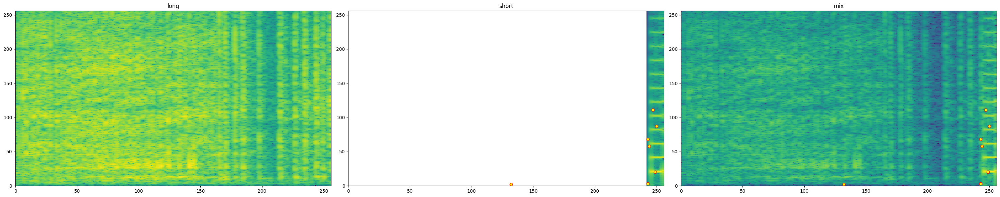

In [ ]:
 # plot input audio:
fig, axs = plt.subplots(1, 3, figsize=(30,6))

axs[0].pcolormesh(10*torch.log10(spec_long.squeeze()).detach().cpu())
axs[0].set_title('long')

axs[1].pcolormesh(10*torch.log10(spec_short.squeeze()).detach().cpu())
axs[1].set_title('short')
dr = model.sample_rate / model.resample_rate #downsample ratio

axs[1].plot

axs[2].pcolormesh(10*torch.log10(spec_mix.squeeze()).detach().cpu())
axs[2].set_title('mix')

#pad_offset is expressed from the original audio before downsampling!
input_points = input_points.squeeze()
for t_idx, f_idx in input_points:
  #t_idx = (info_short["time_centroid_s"]*sr + pad_offset)/(model.hop_length*dr)
  #f_idx = info_short["spectral_centroid_hz"] * model.n_fft / sr
  #print(f" centroid: {info_short['time_centroid_s']:.3f}s, pad offset: {pad_offset} samples= {pad_offset/sr:.4f}s / {model.hop_length} hop len = {pad_offset/model.hop_length:.2f} hop idx -> t idx: {t_idx:.2f}. f_idx: {f_idx:.2f}")
  axs[1].plot(t_idx, f_idx, marker="o", markersize=6, markeredgecolor="red", markerfacecolor="yellow")
  axs[2].plot(t_idx, f_idx, marker="o", markersize=6, markeredgecolor="red", markerfacecolor="yellow")

plt.tight_layout()
plt.show()

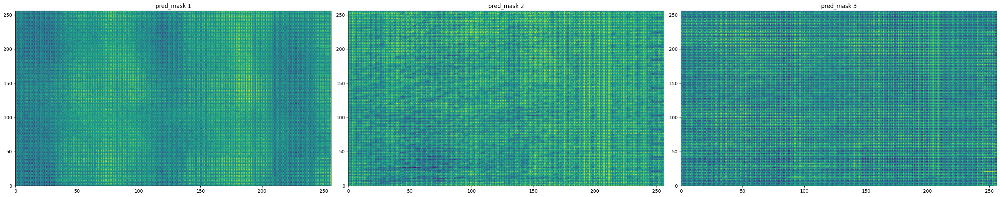

In [ ]:
# plot predicted masks:

fig, axs = plt.subplots(1,3, figsize=(30,6))
axs[0].pcolormesh(pred_mask[0].squeeze().detach().cpu())
axs[0].set_title('pred_mask 1')
axs[1].pcolormesh(pred_mask[1].squeeze().detach().cpu())
axs[1].set_title('pred_mask 2')
axs[2].pcolormesh(pred_mask[2].squeeze().detach().cpu())
axs[2].set_title('pred_mask 3')
plt.tight_layout()
plt.show()

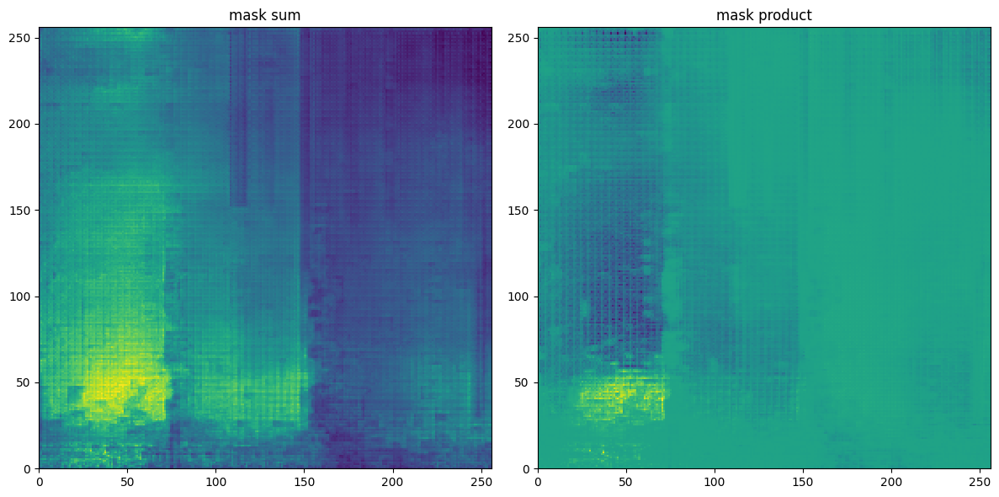

In [ ]:
# plot combinations of masks
mask_sum = torch.sum(pred_mask, dim=0)
mask_product = pred_mask[0] * pred_mask[1] * pred_mask[2]
fig, axs = plt.subplots(1,2, figsize=(12,6))
axs[0].pcolormesh(mask_sum.detach().cpu())
axs[0].set_title('mask sum')
axs[1].pcolormesh(mask_product.detach().cpu())
axs[1].set_title('mask product')
plt.tight_layout()
plt.show()

In [ ]:
# plot predicted audio spectrum:
fig, axs = plt.subplots(1, 3, figsize=(30,6))

axs[0].pcolormesh(10*torch.log10(pred_spec.squeeze()[0]).detach().cpu())
axs[0].set_title('pred mag 1')

axs[1].pcolormesh(10*torch.log10(pred_spec.squeeze()[1]).detach().cpu())
axs[1].set_title('pred mag 2')

axs[2].pcolormesh(10*torch.log10(pred_spec.squeeze()[2]).detach().cpu())
axs[2].set_title('pred mag 3')
plt.tight_layout()
plt.show()

## FIXME:

In [ ]:
# evaluate:
true_source = torch.cat([mix_chunk, longer_audio_chunk, padded_audio_chunk], dim=0).cpu().numpy()# mix_3ch.cpu().numpy()
estimated_source = pred_audio.cpu().numpy()
#print(true_source.shape)
sdr, sir, sar, _ = bss_eval_sources(true_source, estimated_source)#[None, :, :], estimated_source[None, :, :])
print(f"sdr {sdr}, sir {sir}, sar {sar}")

In [ ]:
## gather some statistics about reconstruction
sdr_arr = []
sir_arr = []
sar_arr = []


for idx, (mix, longer_audio, padded_audio, filename_long, filename_short)in enumerate(dataset):
  with torch.inference_mode():
    mix_chunk = mix[:, :model.input_chunk_size]
    longer_audio_chunk = longer_audio[:, :model.input_chunk_size]
    padded_audio_chunk = padded_audio[:, :model.input_chunk_size]
    spec_mix, phase_mix = model.encoder(mix_chunk.to(device))
    spec_long, phase_long = model.encoder(longer_audio_chunk.to(device))
    spec_short, phase_short = model.encoder(padded_audio_chunk.to(device))

    mix_3ch = torch.cat([mix_chunk, mix_chunk, mix_chunk], dim=0)
    pred_audio, mix_spec_in, phase_in, pred_mag, pred_mask, iou_scores = model(mix_3ch.to(device))


In [ ]:
import IPython
sr = model.sample_rate
print("mix")
IPython.display.display(IPython.display.Audio(mix, rate=sr))

print("long")
IPython.display.display(IPython.display.Audio(longer_audio, rate=sr))

print("padded")

IPython.display.display(IPython.display.Audio(padded_audio, rate=sr))

mix


long


/usr/local/lib/python3.10/dist-packages/IPython/lib/display.py:174: RuntimeWarning: invalid value encountered in true_divide
  scaled = data / normalization_factor * 32767


padded


In [ ]:
IPython.display.display(IPython.display.Audio(pred_audio[2].detach().cpu(), rate=sr))

# Train

In [ ]:
# this instantiates a new model
run_train_validate(test_audio_metadata_json="dev_audio_metadata.json",
                  train_audio_metadata_json="eval_audio_metadata.json",
                  fsd_train_location="/content/FSD50K.dev_audio" ,
                  fsd_test_location="/content/FSD50K.eval_audio")

In [ ]:
# load saved checkpoint
model = SamWrapper(spec_dim=(256,256),
                   sample_rate=44100,
                   resample_rate=22050,
                   saved_model_state_dict=None).to(device)

load_saved_model = True

if load_saved_model:
  #checkpoint_path = '/content/drive/MyDrive/models/vision_encoder_finetune-LOGL2loss_freq-lr1e-05-4-epoch_08-07-23_21:19:10.pth'
  #checkpoint_path = '/content/drive/MyDrive/models/vision_encoder_finetune-LOGL2loss_freq-lr1e-05-84-epoch_08-08-23_02:01:38.pth'
  #checkpoint_path = '/content/drive/MyDrive/models/vision_encoder_finetune-LOGL2loss_freq-lr_1e-05.pth'
  checkpoint_path = '/content/drive/MyDrive/models/best_SAM_vision_encoder_finetune_run_14_bilinear-LOGL2loss_freq-lr_1e-05.pth'

  print(f"loading {checkpoint_path}")
  checkpoint = torch.load(checkpoint_path)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  optimizer = torch.optim.Adam(model.sam_model.vision_encoder.parameters(), lr=1e-5, weight_decay=0)
  optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
  epoch = checkpoint['epoch']
  train_losses = checkpoint['train_loss']
  test_losses = checkpoint['test_loss']
  train_accs = checkpoint['train_acc']
  test_accs = checkpoint['test_acc']
  save_time = checkpoint['save_time']

  print(f"train_loss: {train_losses}\ntest_loss: {test_losses}\ntrain_acc: {train_accs}\ntest_acc: {test_accs}\nsave_time: {save_time}")

SamWrapper model n_fft: 510, win len: 510, hop len: 63, sample/resample: 2.0 -> input_chunk_size 32130.0


loading /content/drive/MyDrive/models/best_SAM_vision_encoder_finetune_run_14_bilinear-LOGL2loss_freq-lr_1e-05.pth
train_loss: [0.0010897621616260387]
test_loss: []
train_acc: [-45.31492801981874]
test_acc: []
save_time: 08-16-23_19:08:56


In [ ]:
#### Define Training and Testing Loops:

from tqdm.auto import tqdm
from segsep.utils import should_skip_chunk
from torch.utils.data import SubsetRandomSampler

# --------------------------------------------------------------------------------------------------
def _train(model, dataloader, optimizer, loss_fn, acc_fn, device, upscale_mask=False, verbose=False):
  model.train()
  epoch_loss = 0
  epoch_acc = 0

  # automatic mixed precision scaler:
  scaler = torch.cuda.amp.GradScaler()

  # choose chunks of audio of chunk_size samples such that
  # each chunk results in a STFT of model.spec_dim[0] time bins
  hop_len = model.hop_length
  hop_cnt = model.spec_dim[0]
  chunk_size = model.input_chunk_size
  print(f"choosing audio of {chunk_size} samples -> {chunk_size/model.resample_rate:.5f}s")

  for idx, (mix_audio, source_audio) in enumerate(tqdm(dataloader)):
    optimizer.zero_grad()
    # add a 3rd channel to each audio tensor:
    if source_audio.shape[1] == 2:
      source_audio_ch3=(source_audio[:,0]-source_audio[:,1]).unsqueeze(0)
      source_audio = torch.cat((source_audio, source_audio_ch3), dim=1)
    elif source_audio.shape[1] == 1:
        source_audio = torch.cat((source_audio, source_audio, source_audio), dim=1)
    if mix_audio.shape[1] == 2:
      mix_audio_ch3=(mix_audio[:,0]-mix_audio[:,1]).unsqueeze(0)
      mix_audio = torch.cat((mix_audio, mix_audio_ch3), dim=1)
    elif mix_audio.shape[1] == 1:
      mix_audio = torch.cat((mix_audio, mix_audio, mix_audio), dim=1)


    track_loss = 0
    track_acc = 0
    chunk_cnt = 0
    skip_chunk_cnt = 0
    sample_cnt = mix_audio.shape[2] # [batch, channel, audio]

    mix_audio = mix_audio.squeeze().to(device)
    source_audio = source_audio.squeeze().to(device)
    # omit last chunk if its size would be less than chunk_size
    for start_idx in range(0, sample_cnt-chunk_size+1, chunk_size):
      end_idx = start_idx + chunk_size
      mix_chunk = mix_audio[:, start_idx:end_idx]
      source_chunk = source_audio[:, start_idx:end_idx]
      #print(f"doing idx {start_idx}:{end_idx} - {float(end_idx)/mix_audio_3.shape[1]:.3f}")

      if should_skip_chunk(mix_chunk) or should_skip_chunk(source_chunk):
        skip_chunk_cnt += 1
        continue

      #print(f"mix chunk shape {mix_chunk.shape}")
      if torch.isnan(mix_chunk).any():
        print("input data contains nan!")
        mix_chunk = torch.nan_to_num(mix_chunk)

      # context for automatic mixed precision
      with torch.cuda.amp.autocast():
        pred_audio, mix_spec_in, phase_in, pred_mag, upscaled_pred_mask, iou_scores = model(audio_in=mix_chunk,
                                                                                            upscale_mask=upscale_mask)

        if torch.isnan(pred_audio).any():
          print("prediction contains nan!")
          continue
          #pred_audio = torch.nan_to_num(pred_audio)

        trim_idx = min(pred_audio.shape[1], source_chunk.shape[1])

        # calculate loss/acc on SPEC
        source_spec = torch.abs(model.encoder(source_chunk))
        loss = loss_fn(pred_mag.squeeze(), source_spec)
        acc = acc_fn(pred_mag, source_spec)

      epoch_loss += loss.item()
      track_loss += loss.item()

      epoch_acc += acc.item()
      track_acc += acc.item()
      chunk_cnt += 1

      # traditional backward pass
      #loss.backward()
      #optimizer.step()

      # backward pass with automatic mixed precision
      scaler.scale(loss).backward()
      scaler.step(optimizer)
      scaler.update()

      # madre mia
      del pred_audio
      del loss
      del acc

    del mix_audio
    del source_audio

    torch.cuda.empty_cache()
    if verbose:
      print(f"TRAIN track {idx}/{len(dataloader)} loss: {track_loss}, track acc: {track_acc:.4f}, skip chunk cnt: {skip_chunk_cnt}/{chunk_cnt}")
  return epoch_loss / len(dataloader), epoch_acc / len(dataloader)

# --------------------------------------------------------------------------------------------------
def _validate(model, dataloader, loss_fn, acc_fn, device, subset_proportion=0.1, upscale_mask=False, verbose=False):
  model.eval()
  epoch_loss = 0
  epoch_acc = 0

  with torch.inference_mode():

    subset_sample_cnt = int(len(dataloader) * subset_proportion)
    subset_indices = torch.randperm(len(dataloader))[:subset_sample_cnt]
    subset_sampler = SubsetRandomSampler(subset_indices)
    subset_dataloader = torch.utils.data.DataLoader(dataloader.dataset,
                                                    batch_size=dataloader.batch_size,
                                                    sampler=subset_sampler,
                                                    num_workers=dataloader.num_workers,
                                                    pin_memory=dataloader.pin_memory)

    # choose chunks of audio of chunk_size samples such that
    # each chunk results in a STFT of model.spec_dim[0] time bins
    hop_len = model.hop_length
    hop_cnt = model.spec_dim[0]
    chunk_size = model.input_chunk_size

    #print(f"choosing audio of {chunk_size} samples -> {chunk_size/model.resample_rate:.5f}s")

    for idx, (mix_audio, source_audio) in enumerate(tqdm(subset_dataloader)):
      # add a 3rd channel to each audio tensor:
      if source_audio.shape[1] == 2:
        source_audio_ch3=(source_audio[:,0]-source_audio[:,1]).unsqueeze(0)
        source_audio = torch.cat((source_audio, source_audio_ch3), dim=1)
      elif source_audio.shape[1] == 1:
          source_audio = torch.cat((source_audio, source_audio, source_audio), dim=1)
      if mix_audio.shape[1] == 2:
        mix_audio_ch3=(mix_audio[:,0]-mix_audio[:,1]).unsqueeze(0)
        mix_audio = torch.cat((mix_audio, mix_audio_ch3), dim=1)
      elif mix_audio.shape[1] == 1:
        mix_audio = torch.cat((mix_audio, mix_audio, mix_audio), dim=1)

      track_loss = 0
      track_acc = 0
      chunk_cnt = 0
      skip_chunk_cnt = 0
      sample_cnt = mix_audio.shape[2] # [batch, channel, audio]

      mix_audio = mix_audio.squeeze().to(device)
      source_audio = source_audio.squeeze().to(device)
      # omit last chunk if its size would be less than chunk_size
      for start_idx in range(0, sample_cnt-chunk_size+1, chunk_size):
        end_idx = start_idx + chunk_size
        mix_chunk = mix_audio[:, start_idx:end_idx]
        source_chunk = source_audio[:, start_idx:end_idx]
        #print(f"doing idx {start_idx}:{end_idx} - {float(end_idx)/mix_audio.shape[1]:.3f}")

        if should_skip_chunk(mix_chunk) or should_skip_chunk(source_chunk):
          skip_chunk_cnt += 1
          continue

        #print(f"mix chunk shape {mix_chunk.shape}")
        if torch.isnan(mix_chunk).any():
          print("input data contains nan!")
          continue
          #mix_chunk = torch.nan_to_num(mix_chunk)
        pred_audio, mix_spec_in, phase_in, pred_mag, upscaled_pred_mask, iou_scores = model(audio_in=mix_chunk,
                                                                                            upscale_mask=upscale_mask)
        if torch.isnan(pred_audio).any():
          print("predicted audio contains nan!")
          continue
        trim_idx = min(pred_audio.shape[1], source_chunk.shape[1])

        # calculate loss/acc on SPEC
        source_spec = torch.abs(model.encoder(source_chunk))
        loss = loss_fn(pred_mag.squeeze(), source_spec)
        acc = acc_fn(pred_mag, source_spec)

        epoch_loss += loss.item()
        track_loss += loss.item()

        epoch_acc += acc.item()
        track_acc += acc.item()

        chunk_cnt += 1

        # madre mia
        del pred_audio
        del loss
      del mix_audio
      del source_audio
      torch.cuda.empty_cache()
      if verbose:
        print(f"TEST track {idx}/{len(subset_dataloader)} loss: {track_loss:.8f}, track acc: {track_acc:.4f}, skip chunk cnt: {skip_chunk_cnt}/{chunk_cnt}")
  return epoch_loss / len(subset_dataloader), epoch_acc / len(subset_dataloader)

In [ ]:
# reload model
model = SamWrapper(spec_dim=(256,256),
                   sample_rate=44100,
                   resample_rate=22050,
                   saved_model_state_dict=None).to(device)

SamWrapper model n_fft: 510, win len: 510, hop len: 63, sample/resample: 2.0 -> input_chunk_size 32130.0


In [ ]:
# Freeze parameters
for name, param in model.sam_model.named_parameters():
  if name.startswith("vision_encoder"):
    param.requires_grad_(False)
  elif name.startswith("prompt_encoder"):
    param.requires_grad_(False)
  elif name.startswith("mask_decoder"):
    param.requires_grad_(True)


In [ ]:
summary(model=model,
        input_size=(3, model.input_chunk_size),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                                     Input Shape          Output Shape         Param #              Trainable
SamWrapper (SamWrapper)                                                     [3, 32130]           [3, 32130]           --                   True
├─Resample (downsampler)                                                    [3, 32130]           [3, 16065]           --                   --
├─SamModel (sam_model)                                                      --                   [1, 1, 3, 256, 256]  --                   True
│    └─SamPromptEncoder (prompt_encoder)                                    --                   --                   (recursive)          True
│    │    └─SamPositionalEmbedding (shared_embedding)                       [64, 64, 2]          [64, 64, 256]        --                   --
│    └─SamVisionEncoder (vision_encoder)                                    [1, 3, 1024, 1024]   [1, 256, 64, 64]     3,145,728        

In [ ]:
# Initialize stats tracking ONLY if not loading new model!
train_losses = []
test_losses = []
train_accs = []
test_accs = []

In [ ]:
best_test_loss = float('inf')
best_train_loss = float('inf')


In [ ]:
# Set trainable parameters
learning_rate = 1e-5
#trainable_parameters = list(model.sam_model.mask_decoder.parameters()) + list (model.sam_model.vision_encoder.parameters())
#trainable_parameters = list(model.sam_model.vision_encoder.parameters())
trainable_parameters = list(model.sam_model.mask_decoder.parameters())
optimizer = torch.optim.Adam(trainable_parameters, lr=learning_rate, weight_decay=0)


# Training Log

### Tues 08.09.2023
- mask decoder; full dataset; bug in the model saving: saved the overfit model well past midnight, overwrote the best
- fix: fixed logic, saving only best test loss values; subset test ratio 0.1

### Wed 09.09.2023
#### Run 1
- vision encoder: saving best test loss value, full dataset 4kHz centroid difference

#### Run 2
- same as (1) but saving every (5th?) checkpoint regardless of its test performance; subset test ratio 0.2; save LIST of accs/losses instead of the most recent value
- I'm not convinced that this approach is working to create quality masks from the FSD dataset - I'd like to use more distinct sounds than what this simple spectral centroid offers.

Idea:
-use other qualities: spectral flatness, spectral contrast, spectral bandwidth
-> librosa?

#### Run 3
- mask decoder

#### Run 4
- taking Run 2 result and tuning the MASK DECODER only

#### Run 4.2
- continuing Run 4 but with 0.8 subset_proportion

#### Run 5
- start from scratch, train mask decoder and vision encoder together

#### Run 6
- start from scratch, train vision encoder using dataset with spectral criteria [commit 99c6be1](https://github.com/BenjaminOlsen/SegSep/commit/99c6be141732bd7589f29bc2c7a7e20f386be00c)

#### Run 7
- same as 6, but train mask decoder

#### Run 8
- same as 7, but train BOTH mask decoder and vision encoder at the same time

#### Run 9
- same as 6 (vision encoder), but using bilinear interpolation in the model's predicted mask upscaling, [commit 73bcf3c](https://github.com/BenjaminOlsen/SegSep/commit/73bcf3c699dd7a50cda201c1ba93e420fb0f029a)

#### Run 10
- same as 9 but using L2loss_freq instad of LOGL2loss_freq
----> CRASHED

#### Run 11
- same as 9 but using LOGL1loss_freq

#### Run 12
- same as 9 but using L2loss_freq

#### Run 13
- same as 12 mask_decoder

#### Run 14
- Vision encoder, using LOGL2loss_freq, using model spec_size (256,256) to avoid upscaling the prediction to the mask size - instead, we upscale the input spectrum to 1024, 1024, which produced a predicted mask of (256,256), so we do no interpolation to the mask

- saved checkpoint has best_test_loss = 1.22679e-03
best_train_loss = 1.08976e-03)

#### Run 15
- mask decoder, same as 14

In [ ]:
###. trainin' it

train_audio_metadata_json="dev_audio_metadata.json"
test_audio_metadata_json="eval_audio_metadata.json"
fsd_train_location="/content/FSD50K.dev_audio"
fsd_test_location="/content/FSD50K.eval_audio"

model_name = "SAM_vision_encoder_finetune_run_15_bilinear"

centroid_diff_hz = 3000.0

train_dataset = AudioPairDataset(audio_dir=fsd_train_location,
                                json_path=train_audio_metadata_json,
                                centroid_diff_hz=centroid_diff_hz,
                                min_duration_s=11.5,#model.input_chunk_size/model.resample_rate,
                                dummy_mode=False)

test_dataset = AudioPairDataset(audio_dir=fsd_test_location,
                                json_path=test_audio_metadata_json,
                                centroid_diff_hz=centroid_diff_hz,
                                min_duration_s=11.5,# model.input_chunk_size/model.resample_rate,
                                dummy_mode=False)

train_dataloader = torch.utils.data.DataLoader(dataset=train_dataset,
                                                batch_size=1,
                                                num_workers=3,
                                                shuffle=True)

test_dataloader = torch.utils.data.DataLoader(dataset=test_dataset,
                                                batch_size=1,
                                                num_workers=3,
                                                shuffle=True)


# tracking best loss for stopping condition

patience = 10 # epochs to tolerate lack of improvement
no_improve_counter = 0 # counter to track lack of improvement

num_epochs = 199
# Training and validation loop
for epoch in range(num_epochs):
  print(f"starting epoch {epoch}")
  # Training

  train_loss, train_acc = _train(model=model,
                                dataloader=train_dataloader,
                                optimizer=optimizer,
                                loss_fn=LOGL2loss_freq,
                                acc_fn=si_snr,
                                device=device,
                                upscale_mask=True,
                                verbose=False)

  mean_train_loss = 0 if len(train_losses) == 0 else mean(train_losses)
  mean_train_acc = 0 if len(train_accs) == 0 else mean(train_accs)

  if train_loss < best_train_loss:
    print(f"~~~Best Train loss! {train_loss} <- {best_train_loss}; delta {best_train_loss-train_loss}")
    best_train_loss = train_loss

  delta_loss = train_loss - mean_train_loss
  delta_acc = train_acc - mean_train_acc
  print(f"epoch {epoch} train done -> avg train_loss: {train_loss:.5e} (delta {delta_loss:.5e}), acc: {train_acc:.5e} (delta {delta_acc:.5e})")
  train_losses.append(train_loss)
  train_accs.append(train_acc)

  print(f"mean train_loss so far: {mean(train_losses):.5e}, acc: {mean(train_accs):.5e}")

  # Validation
  test_loss, test_acc = _validate(model=model,
                                  dataloader=test_dataloader,
                                  loss_fn=LOGL2loss_freq,
                                  acc_fn=si_snr,
                                  device=device,
                                  subset_proportion=0.8,
                                  upscale_mask=True,
                                  verbose=False)



  mean_test_loss = 0 if len(test_losses) == 0 else mean(test_losses)
  mean_test_acc = 0 if len(test_accs) == 0 else mean(test_accs)
  delta_loss = test_loss - mean_test_loss
  delta_acc = test_acc - mean_test_acc
  print(f"epoch {epoch} test done -> avg test_loss: {test_loss:.5e} (delta {delta_loss:.5e}), acc: {test_acc:.5e} (delta {delta_acc:.5e})")
  test_losses.append(test_loss)
  test_accs.append(test_acc)
  print(f"mean test_loss so far: {mean(test_losses):.5e}, acc: {mean(test_accs):.5e}")

  # Print stats
  print(f"Epoch {epoch+1}/{num_epochs}:")
  print(f"Train Loss: {train_loss:.5e}, Train Acc: {train_acc:.5e}")
  print(f"Test Loss: {test_loss:.5e}, Test Acc: {test_acc:.5e}")

  if test_loss < best_test_loss:
    print(f"~~~~~~~~~New Best Test Loss! {test_loss:.5e} <- {best_test_loss:.5e} (delta: {test_loss-best_test_loss:.5e})")
    best_test_loss = test_loss
    no_improve_counter = 0

    # save best model
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    checkpoint_path = f'/content/drive/MyDrive/models/best_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    print(f"SAVING checkpoint: {checkpoint_path}")
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_test_loss': best_test_loss,
        'train_loss': train_losses,
        'test_loss': test_losses,
        'train_acc': train_accs,
        'test_acc': test_accs,
        'save_time': date_time
          }, checkpoint_path)

    #hack: save a dummy file with some info in the name so i can see it without being there
    info_path = f'/content/drive/MyDrive/models/new_best_{date_time}-{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save(0, info_path)

  else:
    no_improve_counter += 1
    print(f"no improvement, counter at: {no_improve_counter}")

    #hack: save a dummy file with some info in the name so i can see it without being there
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    info_path = f'/content/drive/MyDrive/models/no_improvement_cnt_{no_improve_counter}_epoch_{epoch}_{date_time}-{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save(0, info_path)


  if no_improve_counter > patience:
    print("Early stopping due to no improvement!")

    #hack: save a dummy file with some info in the name so i can see it without being there
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    info_path = f'/content/drive/MyDrive/models/STOPPED_EARLY_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save({
        'epoch': epoch,
        'train_loss': train_losses,
        'test_loss': test_losses
      }, info_path)
    break

  if (epoch + 1) % 5 == 0:
  # save intermediate checkpoint anyway
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    checkpoint_path = f'/content/drive/MyDrive/models/intermediate_epoch_{epoch}_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    print(f"SAVING checkpoint: {checkpoint_path}")
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_test_loss': best_test_loss,
        'train_loss': train_losses,
        'test_loss': test_losses,
        'train_acc': train_accs,
        'test_acc': test_accs,
        'save_time': date_time
          }, checkpoint_path)

found 8325 files of length 11.5s or longer
found 3514 files of length 11.5s or longer
starting epoch 0
choosing audio of 32130 samples -> 1.45714s


  0%|          | 0/8325 [00:00<?, ?it/s]

~~~Best Train loss! 0.0008966573201363121 <- inf; delta inf
epoch 0 train done -> avg train_loss: 8.96657e-04 (delta 8.96657e-04), acc: -3.89064e+01 (delta -3.89064e+01)
mean train_loss so far: 8.96657e-04, acc: -3.89064e+01


  0%|          | 0/2811 [00:00<?, ?it/s]

epoch 0 test done -> avg test_loss: 1.20109e-03 (delta 1.20109e-03), acc: -1.30101e+01 (delta -1.30101e+01)
mean test_loss so far: 1.20109e-03, acc: -1.30101e+01
Epoch 1/199:
Train Loss: 8.96657e-04, Train Acc: -3.89064e+01
Test Loss: 1.20109e-03, Test Acc: -1.30101e+01
~~~~~~~~~New Best Test Loss! 1.20109e-03 <- inf (delta: -inf)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_vision_encoder_finetune_run_15_bilinear-LOGL2loss_freq-lr_1e-05.pth
starting epoch 1
choosing audio of 32130 samples -> 1.45714s


  0%|          | 0/8325 [00:00<?, ?it/s]

epoch 1 train done -> avg train_loss: 8.98514e-04 (delta 1.85650e-06), acc: -4.27132e+01 (delta -3.80683e+00)
mean train_loss so far: 8.97586e-04, acc: -4.08098e+01


  0%|          | 0/2811 [00:00<?, ?it/s]

epoch 1 test done -> avg test_loss: 1.16851e-03 (delta -3.25855e-05), acc: -1.56970e+02 (delta -1.43960e+02)
mean test_loss so far: 1.18480e-03, acc: -8.49900e+01
Epoch 2/199:
Train Loss: 8.98514e-04, Train Acc: -4.27132e+01
Test Loss: 1.16851e-03, Test Acc: -1.56970e+02
~~~~~~~~~New Best Test Loss! 1.16851e-03 <- 1.20109e-03 (delta: -3.25855e-05)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_vision_encoder_finetune_run_15_bilinear-LOGL2loss_freq-lr_1e-05.pth
starting epoch 2
choosing audio of 32130 samples -> 1.45714s


  0%|          | 0/8325 [00:00<?, ?it/s]

~~~Best Train loss! 0.0008945181606104691 <- 0.0008966573201363121; delta 2.1391595258430166e-06
epoch 2 train done -> avg train_loss: 8.94518e-04 (delta -3.06741e-06), acc: -4.69479e+01 (delta -6.13811e+00)
mean train_loss so far: 8.96563e-04, acc: -4.28558e+01


  0%|          | 0/2811 [00:00<?, ?it/s]

epoch 2 test done -> avg test_loss: 1.14828e-03 (delta -3.65252e-05), acc: -3.18198e+01 (delta 5.31703e+01)
mean test_loss so far: 1.17263e-03, acc: -6.72666e+01
Epoch 3/199:
Train Loss: 8.94518e-04, Train Acc: -4.69479e+01
Test Loss: 1.14828e-03, Test Acc: -3.18198e+01
~~~~~~~~~New Best Test Loss! 1.14828e-03 <- 1.16851e-03 (delta: -2.02324e-05)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_vision_encoder_finetune_run_15_bilinear-LOGL2loss_freq-lr_1e-05.pth
starting epoch 3
choosing audio of 32130 samples -> 1.45714s


  0%|          | 0/8325 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
now = datetime.now()
date_time = now.strftime("%m-%d-%y_%H:%M:%S")
loss_name="LOGL2loss_freq"
checkpoint_path = f'/content/drive/MyDrive/models/intermediate_epoch_{epoch}_{model_name}-{loss_name}-lr_{learning_rate}.pth'
print(f"SAVING checkpoint: {checkpoint_path}")

In [ ]:

torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'best_test_loss': best_test_loss,
    'train_loss': train_losses,
    'test_loss': test_losses,
    'train_acc': train_accs,
    'test_acc': test_accs,
    'save_time': date_time
      }, checkpoint_path)

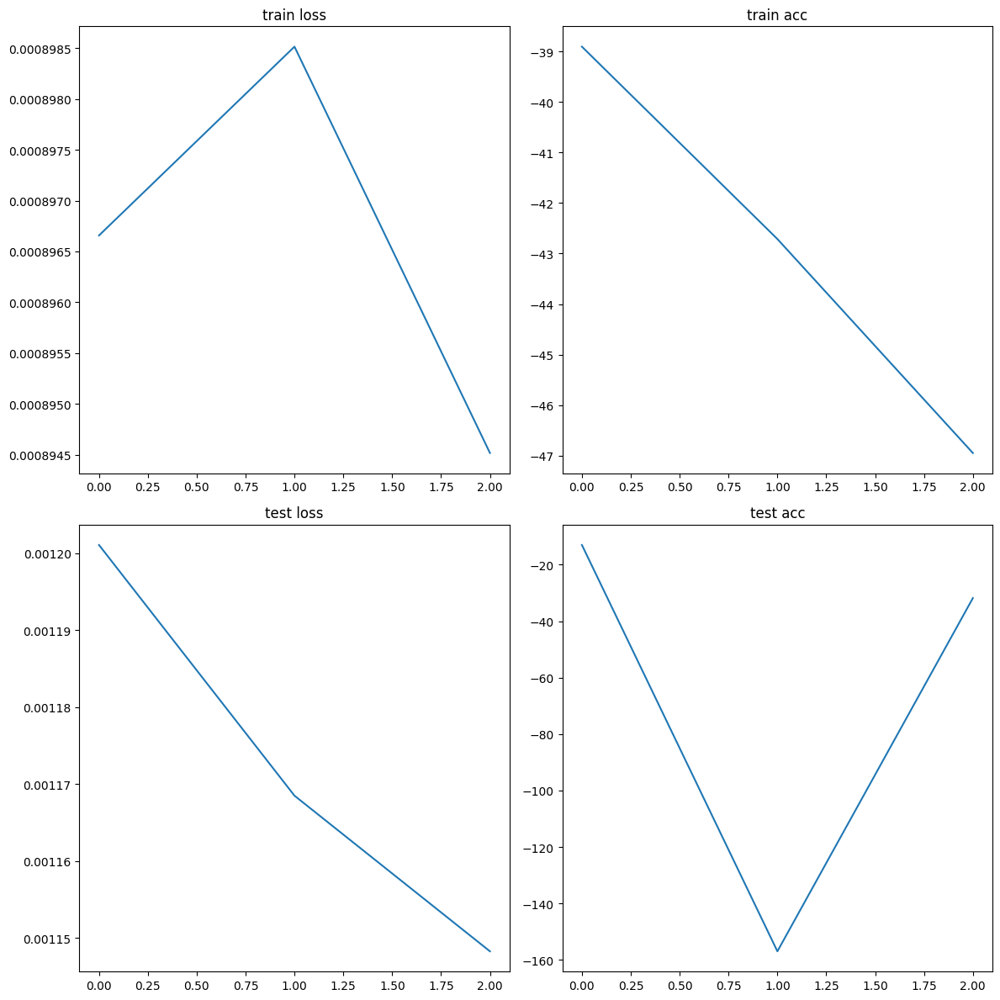

In [ ]:
# plot the loss & accuracy over the course of training
fig, axs = plt.subplots(2, 2, figsize=(12,12))
axs[0,0].plot(train_losses)
axs[0,0].set_title('train loss')
axs[0,1].plot(train_accs)
axs[0,1].set_title('train acc')
axs[1,0].plot(test_losses)
axs[1,0].set_title('test loss')
axs[1,1].plot(test_accs)
axs[1,1].set_title('test acc')
plt.tight_layout()
plt.show()

In [ ]:
now = datetime.now()
date_time = now.strftime("%m-%d-%y_%H:%M:%S")
print(f"done at {date_time}")

# train mask decoder

In [ ]:
# load saved checkpoint
model = SamWrapper(spec_dim=(256,256),
                   sample_rate=44100,
                   resample_rate=22050,
                   saved_model_state_dict=None).to(device)

# Freeze parameters
for name, param in model.sam_model.named_parameters():
  if name.startswith("vision_encoder"):
    param.requires_grad_(False)
  elif name.startswith("prompt_encoder"):
    param.requires_grad_(False)
  elif name.startswith("mask_decoder"):
    param.requires_grad_(True)




# Initialize stats tracking ONLY if not loading new model!
train_losses = []
test_losses = []
train_accs = []
test_accs = []



learning_rate = 1e-5
best_test_loss = float('inf')
best_train_loss = float('inf')




# Set trainable parameters
#trainable_parameters = list(model.sam_model.mask_decoder.parameters()) + list (model.sam_model.vision_encoder.parameters())
#trainable_parameters = list(model.sam_model.vision_encoder.parameters())
trainable_parameters = list(model.sam_model.mask_decoder.parameters())
optimizer = torch.optim.Adam(trainable_parameters, lr=learning_rate, weight_decay=0)












###. trainin' it

train_audio_metadata_json="dev_audio_metadata.json"
test_audio_metadata_json="eval_audio_metadata.json"
fsd_train_location="/content/FSD50K.dev_audio"
fsd_test_location="/content/FSD50K.eval_audio"

model_name = "SAM_mask_decoder_finetune_run_7"

centroid_diff_hz = 3000.0

train_dataset = AudioPairDataset(audio_dir=fsd_train_location,
                                json_path=train_audio_metadata_json,
                                centroid_diff_hz=centroid_diff_hz,
                                min_duration_s = model.input_chunk_size/model.resample_rate,
                                dummy_mode=False)

test_dataset = AudioPairDataset(audio_dir=fsd_test_location,
                                json_path=test_audio_metadata_json,
                                centroid_diff_hz=centroid_diff_hz,
                                min_duration_s = model.input_chunk_size/model.resample_rate,
                                dummy_mode=False)

train_dataloader = torch.utils.data.DataLoader(dataset=train_dataset,
                                                batch_size=1,
                                                num_workers=0,
                                                shuffle=True)

test_dataloader = torch.utils.data.DataLoader(dataset=test_dataset,
                                                batch_size=1,
                                                num_workers=0,
                                                shuffle=True)


# tracking best loss for stopping condition

patience = 10 # epochs to tolerate lack of improvement
no_improve_counter = 0 # counter to track lack of improvement

num_epochs = 199
# Training and validation loop
for epoch in range(num_epochs):
  print(f"starting epoch {epoch}")
  # Training

  train_loss, train_acc = _train(model=model,
                                dataloader=train_dataloader,
                                optimizer=optimizer,
                                loss_fn=LOGL2loss_freq,
                                acc_fn=si_snr,
                                device=device,
                                verbose=False)

  mean_train_loss = 0 if len(train_losses) == 0 else mean(train_losses)
  mean_train_acc = 0 if len(train_accs) == 0 else mean(train_accs)

  if train_loss < best_train_loss:
    print(f"~~~Best Train loss! {train_loss} <- {best_train_loss}; delta {best_train_loss-train_loss}")
    best_train_loss = train_loss

  delta_loss = train_loss - mean_train_loss
  delta_acc = train_acc - mean_train_acc
  print(f"epoch {epoch} train done -> avg train_loss: {train_loss:.5e} (delta {delta_loss:.5e}), acc: {train_acc:.5e} (delta {delta_acc:.5e})")
  train_losses.append(train_loss)
  train_accs.append(train_acc)

  print(f"mean train_loss so far: {mean(train_losses):.5e}, acc: {mean(train_accs):.5e}")

  # Validation
  test_loss, test_acc = _validate(model=model,
                                  dataloader=test_dataloader,
                                  loss_fn=LOGL2loss_freq,
                                  acc_fn=si_snr,
                                  device=device,
                                  subset_proportion=0.8,
                                  verbose=False)


  if test_loss < best_test_loss:
    print(f"~~~~~~~~~New Best Test Loss! {test_loss:.5e} <- {best_test_loss:.5e} (delta: {test_loss-best_test_loss:.5e})")
    best_test_loss = test_loss
    no_improve_counter = 0

    # save best model
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    checkpoint_path = f'/content/drive/MyDrive/models/best_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    print(f"SAVING checkpoint: {checkpoint_path}")
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_test_loss': best_test_loss,
        'train_loss': train_losses,
        'test_loss': test_losses,
        'train_acc': train_accs,
        'test_acc': test_accs,
        'save_time': date_time
          }, checkpoint_path)

    #hack: save a dummy file with some info in the name so i can see it without being there
    info_path = f'/content/drive/MyDrive/models/new_best_{date_time}-{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save(0, info_path)

  else:
    no_improve_counter += 1
    print(f"no improvement, counter at: {no_improve_counter}")

    #hack: save a dummy file with some info in the name so i can see it without being there
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    info_path = f'/content/drive/MyDrive/models/no_improvement_cnt_{no_improve_counter}_epoch_{epoch}_{date_time}-{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save(0, info_path)

  mean_test_loss = 0 if len(test_losses) == 0 else mean(test_losses)
  mean_test_acc = 0 if len(test_accs) == 0 else mean(test_accs)
  delta_loss = test_loss - mean_test_loss
  delta_acc = test_acc - mean_test_acc
  print(f"epoch {epoch} test done -> avg test_loss: {test_loss:.5e} (delta {delta_loss:.5e}), acc: {test_acc:.5e} (delta {delta_acc:.5e})")
  test_losses.append(test_loss)
  test_accs.append(test_acc)
  print(f"mean test_loss so far: {mean(test_losses):.5e}, acc: {mean(test_accs):.5e}")

  # Print stats
  print(f"Epoch {epoch+1}/{num_epochs}:")
  print(f"Train Loss: {train_loss:.5e}, Train Acc: {train_acc:.5e}")
  print(f"Test Loss: {test_loss:.5e}, Test Acc: {test_acc:.5e}")


  if no_improve_counter > patience:
    print("Early stopping due to no improvement!")

    #hack: save a dummy file with some info in the name so i can see it without being there
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    info_path = f'/content/drive/MyDrive/models/STOPPED_EARLY_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save({
        'epoch': epoch,
        'train_loss': train_losses,
        'test_loss': test_losses
      }, info_path)
    break

  if (epoch + 1) % 5 == 0:
  # save intermediate checkpoint anyway
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    checkpoint_path = f'/content/drive/MyDrive/models/intermediate_epoch_{epoch}_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    print(f"SAVING checkpoint: {checkpoint_path}")
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_test_loss': best_test_loss,
        'train_loss': train_losses,
        'test_loss': test_losses,
        'train_acc': train_accs,
        'test_acc': test_accs,
        'save_time': date_time
          }, checkpoint_path)

SamWrapper model n_fft: 2046, win len: 2046, hop len: 255, sample/resample: 2.0 -> input_chunk_size 521730.0
found 2003 files of length 23.66122448979592s or longer
found 913 files of length 23.66122448979592s or longer
starting epoch 0
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.3323394426252284e-05 <- inf; delta inf
epoch 0 train done -> avg train_loss: 1.33234e-05 (delta 1.33234e-05), acc: -1.14594e+01 (delta -1.14594e+01)
mean train_loss so far: 1.33234e-05, acc: -1.14594e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.42264e-05 <- inf (delta: -inf)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
epoch 0 test done -> avg test_loss: 1.42264e-05 (delta 1.42264e-05), acc: -1.11666e+01 (delta -1.11666e+01)
mean test_loss so far: 1.42264e-05, acc: -1.11666e+01
Epoch 1/199:
Train Loss: 1.33234e-05, Train Acc: -1.14594e+01
Test Loss: 1.42264e-05, Test Acc: -1.11666e+01
starting epoch 1
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.2286657916212723e-05 <- 1.3323394426252284e-05; delta 1.036736510039561e-06
epoch 1 train done -> avg train_loss: 1.22867e-05 (delta -1.03674e-06), acc: -1.13931e+01 (delta 6.63286e-02)
mean train_loss so far: 1.28050e-05, acc: -1.14263e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.34326e-05 <- 1.42264e-05 (delta: -7.93846e-07)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
epoch 1 test done -> avg test_loss: 1.34326e-05 (delta -7.93846e-07), acc: -1.69285e+01 (delta -5.76185e+00)
mean test_loss so far: 1.38295e-05, acc: -1.40475e+01
Epoch 2/199:
Train Loss: 1.22867e-05, Train Acc: -1.13931e+01
Test Loss: 1.34326e-05, Test Acc: -1.69285e+01
starting epoch 2
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1950878887593192e-05 <- 1.2286657916212723e-05; delta 3.357790286195309e-07
epoch 2 train done -> avg train_loss: 1.19509e-05 (delta -8.54147e-07), acc: -1.12226e+01 (delta 2.03684e-01)
mean train_loss so far: 1.25203e-05, acc: -1.13584e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 2 test done -> avg test_loss: 1.36090e-05 (delta -2.20507e-07), acc: -6.58342e+00 (delta 7.46412e+00)
mean test_loss so far: 1.37560e-05, acc: -1.15595e+01
Epoch 3/199:
Train Loss: 1.19509e-05, Train Acc: -1.12226e+01
Test Loss: 1.36090e-05, Test Acc: -6.58342e+00
starting epoch 3
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1924254003684466e-05 <- 1.1950878887593192e-05; delta 2.662488390872621e-08
epoch 3 train done -> avg train_loss: 1.19243e-05 (delta -5.96056e-07), acc: -1.01065e+01 (delta 1.25183e+00)
mean train_loss so far: 1.23713e-05, acc: -1.10454e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 2
epoch 3 test done -> avg test_loss: 1.35370e-05 (delta -2.19021e-07), acc: -1.14912e+01 (delta 6.82912e-02)
mean test_loss so far: 1.37012e-05, acc: -1.15424e+01
Epoch 4/199:
Train Loss: 1.19243e-05, Train Acc: -1.01065e+01
Test Loss: 1.35370e-05, Test Acc: -1.14912e+01
starting epoch 4
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 4 train done -> avg train_loss: 1.20337e-05 (delta -3.37596e-07), acc: -1.01456e+01 (delta 8.99804e-01)
mean train_loss so far: 1.23038e-05, acc: -1.08654e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.33735e-05 <- 1.34326e-05 (delta: -5.90542e-08)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
epoch 4 test done -> avg test_loss: 1.33735e-05 (delta -3.27719e-07), acc: -1.54853e+01 (delta -3.94287e+00)
mean test_loss so far: 1.36357e-05, acc: -1.23310e+01
Epoch 5/199:
Train Loss: 1.20337e-05, Train Acc: -1.01456e+01
Test Loss: 1.33735e-05, Test Acc: -1.54853e+01
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_4_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
starting epoch 5
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1655136037330036e-05 <- 1.1924254003684466e-05; delta 2.6911796635442976e-07
epoch 5 train done -> avg train_loss: 1.16551e-05 (delta -6.48641e-07), acc: -1.13992e+01 (delta -5.33784e-01)
mean train_loss so far: 1.21957e-05, acc: -1.09544e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 5 test done -> avg test_loss: 1.34957e-05 (delta -1.39985e-07), acc: -1.76908e+01 (delta -5.35983e+00)
mean test_loss so far: 1.36124e-05, acc: -1.32243e+01
Epoch 6/199:
Train Loss: 1.16551e-05, Train Acc: -1.13992e+01
Test Loss: 1.34957e-05, Test Acc: -1.76908e+01
starting epoch 6
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 6 train done -> avg train_loss: 1.16625e-05 (delta -5.33135e-07), acc: -1.08493e+01 (delta 1.05083e-01)
mean train_loss so far: 1.21195e-05, acc: -1.09394e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 2
epoch 6 test done -> avg test_loss: 1.34303e-05 (delta -1.82120e-07), acc: -1.24921e+01 (delta 7.32261e-01)
mean test_loss so far: 1.35864e-05, acc: -1.31197e+01
Epoch 7/199:
Train Loss: 1.16625e-05, Train Acc: -1.08493e+01
Test Loss: 1.34303e-05, Test Acc: -1.24921e+01
starting epoch 7
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 7 train done -> avg train_loss: 1.16841e-05 (delta -4.35407e-07), acc: -1.03313e+01 (delta 6.08070e-01)
mean train_loss so far: 1.20651e-05, acc: -1.08634e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 3
epoch 7 test done -> avg test_loss: 1.35295e-05 (delta -5.68319e-08), acc: -1.54330e+01 (delta -2.31327e+00)
mean test_loss so far: 1.35793e-05, acc: -1.34089e+01
Epoch 8/199:
Train Loss: 1.16841e-05, Train Acc: -1.03313e+01
Test Loss: 1.35295e-05, Test Acc: -1.54330e+01
starting epoch 8
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 8 train done -> avg train_loss: 1.20038e-05 (delta -6.12895e-08), acc: -1.01325e+01 (delta 7.30882e-01)
mean train_loss so far: 1.20583e-05, acc: -1.07822e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.30971e-05 <- 1.33735e-05 (delta: -2.76412e-07)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
epoch 8 test done -> avg test_loss: 1.30971e-05 (delta -4.82136e-07), acc: -8.71763e+00 (delta 4.69123e+00)
mean test_loss so far: 1.35257e-05, acc: -1.28876e+01
Epoch 9/199:
Train Loss: 1.20038e-05, Train Acc: -1.01325e+01
Test Loss: 1.30971e-05, Test Acc: -8.71763e+00
starting epoch 9
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 9 train done -> avg train_loss: 1.17039e-05 (delta -3.54387e-07), acc: -1.03235e+01 (delta 4.58679e-01)
mean train_loss so far: 1.20228e-05, acc: -1.07363e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 9 test done -> avg test_loss: 1.34612e-05 (delta -6.45221e-08), acc: -1.16149e+01 (delta 1.27269e+00)
mean test_loss so far: 1.35192e-05, acc: -1.27603e+01
Epoch 10/199:
Train Loss: 1.17039e-05, Train Acc: -1.03235e+01
Test Loss: 1.34612e-05, Test Acc: -1.16149e+01
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_9_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
starting epoch 10
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 10 train done -> avg train_loss: 1.16973e-05 (delta -3.25558e-07), acc: -8.84458e+00 (delta 1.89173e+00)
mean train_loss so far: 1.19932e-05, acc: -1.05643e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.30336e-05 <- 1.30971e-05 (delta: -6.34818e-08)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
epoch 10 test done -> avg test_loss: 1.30336e-05 (delta -4.85595e-07), acc: -1.21906e+01 (delta 5.69709e-01)
mean test_loss so far: 1.34751e-05, acc: -1.27086e+01
Epoch 11/199:
Train Loss: 1.16973e-05, Train Acc: -8.84458e+00
Test Loss: 1.30336e-05, Test Acc: -1.21906e+01
starting epoch 11
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 11 train done -> avg train_loss: 1.18585e-05 (delta -1.34762e-07), acc: -1.01849e+01 (delta 3.79469e-01)
mean train_loss so far: 1.19820e-05, acc: -1.05327e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 11 test done -> avg test_loss: 1.31205e-05 (delta -3.54542e-07), acc: -6.41790e+00 (delta 6.29066e+00)
mean test_loss so far: 1.34455e-05, acc: -1.21843e+01
Epoch 12/199:
Train Loss: 1.18585e-05, Train Acc: -1.01849e+01
Test Loss: 1.31205e-05, Test Acc: -6.41790e+00
starting epoch 12
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 12 train done -> avg train_loss: 1.17449e-05 (delta -2.37121e-07), acc: -1.03444e+01 (delta 1.88337e-01)
mean train_loss so far: 1.19638e-05, acc: -1.05182e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 2
epoch 12 test done -> avg test_loss: 1.31406e-05 (delta -3.04961e-07), acc: -8.66520e+00 (delta 3.51913e+00)
mean test_loss so far: 1.34221e-05, acc: -1.19136e+01
Epoch 13/199:
Train Loss: 1.17449e-05, Train Acc: -1.03444e+01
Test Loss: 1.31406e-05, Test Acc: -8.66520e+00
starting epoch 13
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 13 train done -> avg train_loss: 1.19114e-05 (delta -5.23499e-08), acc: -1.07004e+01 (delta -1.82211e-01)
mean train_loss so far: 1.19600e-05, acc: -1.05312e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 3
epoch 13 test done -> avg test_loss: 1.37082e-05 (delta 2.86113e-07), acc: -1.46912e+01 (delta -2.77755e+00)
mean test_loss so far: 1.34425e-05, acc: -1.21120e+01
Epoch 14/199:
Train Loss: 1.19114e-05, Train Acc: -1.07004e+01
Test Loss: 1.37082e-05, Test Acc: -1.46912e+01
starting epoch 14
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 14 train done -> avg train_loss: 1.17218e-05 (delta -2.38265e-07), acc: -1.01281e+01 (delta 4.03094e-01)
mean train_loss so far: 1.19441e-05, acc: -1.05044e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 4
epoch 14 test done -> avg test_loss: 1.31517e-05 (delta -2.90813e-07), acc: -1.06722e+01 (delta 1.43981e+00)
mean test_loss so far: 1.34231e-05, acc: -1.20160e+01
Epoch 15/199:
Train Loss: 1.17218e-05, Train Acc: -1.01281e+01
Test Loss: 1.31517e-05, Test Acc: -1.06722e+01
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_14_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
starting epoch 15
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1578758560736685e-05 <- 1.1655136037330036e-05; delta 7.637747659335066e-08
epoch 15 train done -> avg train_loss: 1.15788e-05 (delta -3.65385e-07), acc: -1.13279e+01 (delta -8.23527e-01)
mean train_loss so far: 1.19213e-05, acc: -1.05558e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 5
epoch 15 test done -> avg test_loss: 1.33022e-05 (delta -1.20921e-07), acc: -1.73310e+01 (delta -5.31500e+00)
mean test_loss so far: 1.34156e-05, acc: -1.23482e+01
Epoch 16/199:
Train Loss: 1.15788e-05, Train Acc: -1.13279e+01
Test Loss: 1.33022e-05, Test Acc: -1.73310e+01
starting epoch 16
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 16 train done -> avg train_loss: 1.18275e-05 (delta -9.37816e-08), acc: -8.94121e+00 (delta 1.61463e+00)
mean train_loss so far: 1.19158e-05, acc: -1.04609e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.25086e-05 <- 1.30336e-05 (delta: -5.25074e-07)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
epoch 16 test done -> avg test_loss: 1.25086e-05 (delta -9.07012e-07), acc: -1.30462e+01 (delta -6.97944e-01)
mean test_loss so far: 1.33622e-05, acc: -1.23893e+01
Epoch 17/199:
Train Loss: 1.18275e-05, Train Acc: -8.94121e+00
Test Loss: 1.25086e-05, Test Acc: -1.30462e+01
starting epoch 17
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1498623455246441e-05 <- 1.1578758560736685e-05; delta 8.01351054902441e-08
epoch 17 train done -> avg train_loss: 1.14986e-05 (delta -4.17167e-07), acc: -9.41732e+00 (delta 1.04354e+00)
mean train_loss so far: 1.18926e-05, acc: -1.04029e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 17 test done -> avg test_loss: 1.31621e-05 (delta -2.00119e-07), acc: -2.59739e+01 (delta -1.35846e+01)
mean test_loss so far: 1.33511e-05, acc: -1.31440e+01
Epoch 18/199:
Train Loss: 1.14986e-05, Train Acc: -9.41732e+00
Test Loss: 1.31621e-05, Test Acc: -2.59739e+01
starting epoch 18
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 18 train done -> avg train_loss: 1.19500e-05 (delta 5.74081e-08), acc: -1.02236e+01 (delta 1.79256e-01)
mean train_loss so far: 1.18956e-05, acc: -1.03934e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 2
epoch 18 test done -> avg test_loss: 1.29346e-05 (delta -4.16505e-07), acc: -4.39860e+00 (delta 8.74539e+00)
mean test_loss so far: 1.33292e-05, acc: -1.26837e+01
Epoch 19/199:
Train Loss: 1.19500e-05, Train Acc: -1.02236e+01
Test Loss: 1.29346e-05, Test Acc: -4.39860e+00
starting epoch 19
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 19 train done -> avg train_loss: 1.15572e-05 (delta -3.38471e-07), acc: -1.00166e+01 (delta 3.76810e-01)
mean train_loss so far: 1.18787e-05, acc: -1.03746e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 3
epoch 19 test done -> avg test_loss: 1.34153e-05 (delta 8.61322e-08), acc: -2.04211e+01 (delta -7.73741e+00)
mean test_loss so far: 1.33335e-05, acc: -1.30706e+01
Epoch 20/199:
Train Loss: 1.15572e-05, Train Acc: -1.00166e+01
Test Loss: 1.34153e-05, Test Acc: -2.04211e+01
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_19_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
starting epoch 20
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 20 train done -> avg train_loss: 1.15772e-05 (delta -3.01495e-07), acc: -9.52910e+00 (delta 8.45513e-01)
mean train_loss so far: 1.18644e-05, acc: -1.03343e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 4
epoch 20 test done -> avg test_loss: 1.34193e-05 (delta 8.57685e-08), acc: -3.09858e+00 (delta 9.97199e+00)
mean test_loss so far: 1.33376e-05, acc: -1.25957e+01
Epoch 21/199:
Train Loss: 1.15772e-05, Train Acc: -9.52910e+00
Test Loss: 1.34193e-05, Test Acc: -3.09858e+00
starting epoch 21
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 21 train done -> avg train_loss: 1.18952e-05 (delta 3.08505e-08), acc: -1.09271e+01 (delta -5.92706e-01)
mean train_loss so far: 1.18658e-05, acc: -1.03613e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 5
epoch 21 test done -> avg test_loss: 1.31477e-05 (delta -1.89857e-07), acc: -1.12292e+01 (delta 1.36650e+00)
mean test_loss so far: 1.33289e-05, acc: -1.25336e+01
Epoch 22/199:
Train Loss: 1.18952e-05, Train Acc: -1.09271e+01
Test Loss: 1.31477e-05, Test Acc: -1.12292e+01
starting epoch 22
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1430788299685242e-05 <- 1.1498623455246441e-05; delta 6.78351555611993e-08
epoch 22 train done -> avg train_loss: 1.14308e-05 (delta -4.34969e-07), acc: -9.64555e+00 (delta 7.15739e-01)
mean train_loss so far: 1.18468e-05, acc: -1.03302e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 6
epoch 22 test done -> avg test_loss: 1.28548e-05 (delta -4.74186e-07), acc: -1.29586e+01 (delta -4.25036e-01)
mean test_loss so far: 1.33083e-05, acc: -1.25521e+01
Epoch 23/199:
Train Loss: 1.14308e-05, Train Acc: -9.64555e+00
Test Loss: 1.28548e-05, Test Acc: -1.29586e+01
starting epoch 23
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 23 train done -> avg train_loss: 1.17046e-05 (delta -1.42239e-07), acc: -1.00472e+01 (delta 2.83008e-01)
mean train_loss so far: 1.18409e-05, acc: -1.03184e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 7
epoch 23 test done -> avg test_loss: 1.31693e-05 (delta -1.39015e-07), acc: -8.61754e+00 (delta 3.93454e+00)
mean test_loss so far: 1.33025e-05, acc: -1.23881e+01
Epoch 24/199:
Train Loss: 1.17046e-05, Train Acc: -1.00472e+01
Test Loss: 1.31693e-05, Test Acc: -8.61754e+00
starting epoch 24
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 24 train done -> avg train_loss: 1.17067e-05 (delta -1.34232e-07), acc: -9.64517e+00 (delta 6.73209e-01)
mean train_loss so far: 1.18356e-05, acc: -1.02914e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 8
epoch 24 test done -> avg test_loss: 1.35569e-05 (delta 2.54400e-07), acc: -7.35739e+00 (delta 5.03075e+00)
mean test_loss so far: 1.33127e-05, acc: -1.21869e+01
Epoch 25/199:
Train Loss: 1.17067e-05, Train Acc: -9.64517e+00
Test Loss: 1.35569e-05, Test Acc: -7.35739e+00
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_24_SAM_mask_decoder_finetune_run_7-LOGL2loss_freq-lr_1e-05.pth
starting epoch 25
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 25 train done -> avg train_loss: 1.14815e-05 (delta -3.54086e-07), acc: -9.80612e+00 (delta 4.85332e-01)
mean train_loss so far: 1.18219e-05, acc: -1.02728e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 9
epoch 25 test done -> avg test_loss: 1.36395e-05 (delta 3.26841e-07), acc: -3.64937e+00 (delta 8.53754e+00)
mean test_loss so far: 1.33253e-05, acc: -1.18585e+01
Epoch 26/199:
Train Loss: 1.14815e-05, Train Acc: -9.80612e+00
Test Loss: 1.36395e-05, Test Acc: -3.64937e+00
starting epoch 26
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 26 train done -> avg train_loss: 1.15686e-05 (delta -2.53370e-07), acc: -1.03261e+01 (delta -5.33307e-02)
mean train_loss so far: 1.18125e-05, acc: -1.02748e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 10
epoch 26 test done -> avg test_loss: 1.31008e-05 (delta -2.24494e-07), acc: -2.13923e+01 (delta -9.53378e+00)
mean test_loss so far: 1.33170e-05, acc: -1.22116e+01
Epoch 27/199:
Train Loss: 1.15686e-05, Train Acc: -1.03261e+01
Test Loss: 1.31008e-05, Test Acc: -2.13923e+01
starting epoch 27
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 27 train done -> avg train_loss: 1.15811e-05 (delta -2.31474e-07), acc: -1.06244e+01 (delta -3.49618e-01)
mean train_loss so far: 1.18043e-05, acc: -1.02872e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 11
epoch 27 test done -> avg test_loss: 1.34085e-05 (delta 9.15290e-08), acc: -4.76999e+00 (delta 7.44165e+00)
mean test_loss so far: 1.33202e-05, acc: -1.19459e+01
Epoch 28/199:
Train Loss: 1.15811e-05, Train Acc: -1.06244e+01
Test Loss: 1.34085e-05, Test Acc: -4.76999e+00
Early stopping due to no improvement!


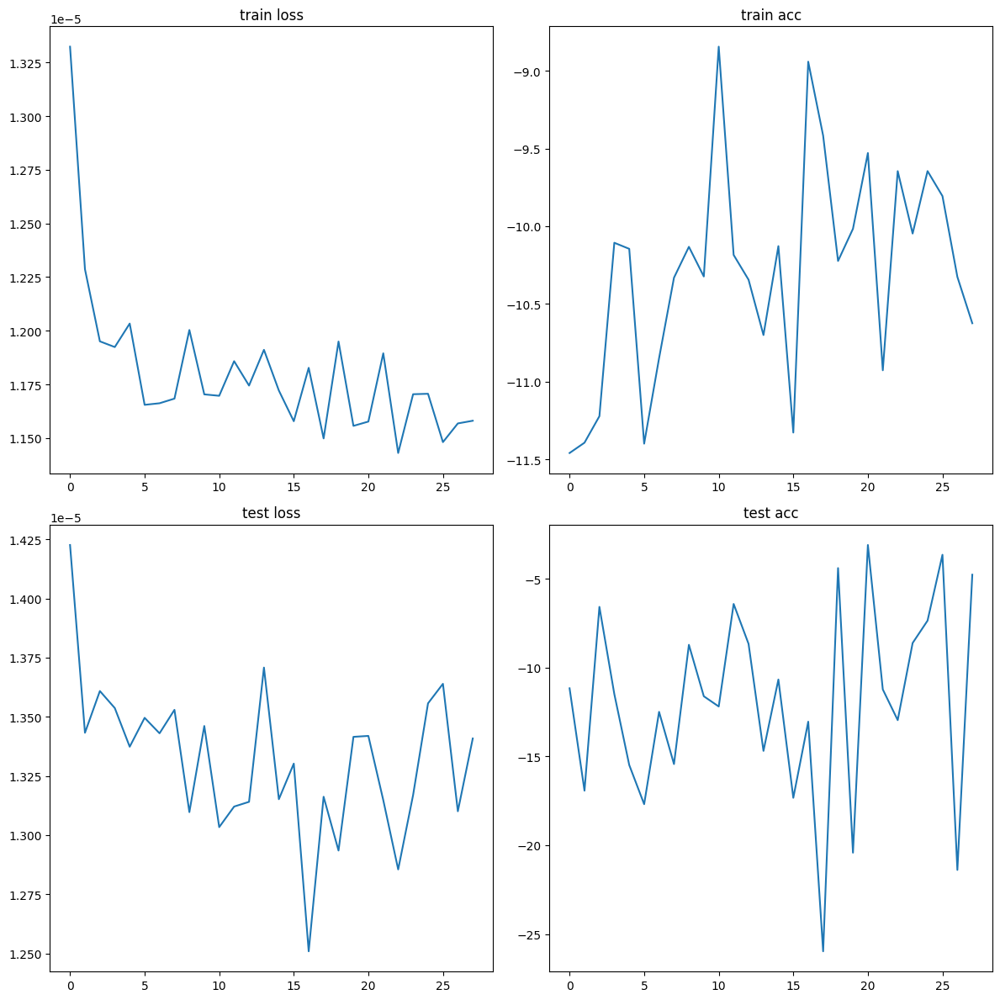

In [ ]:
# plot the loss & accuracy over the course of training
fig, axs = plt.subplots(2, 2, figsize=(12,12))
axs[0,0].plot(train_losses)
axs[0,0].set_title('train loss')
axs[0,1].plot(train_accs)
axs[0,1].set_title('train acc')
axs[1,0].plot(test_losses)
axs[1,0].set_title('test loss')
axs[1,1].plot(test_accs)
axs[1,1].set_title('test acc')
plt.tight_layout()
plt.show()

In [ ]:
now = datetime.now()
date_time = now.strftime("%m-%d-%y_%H:%M:%S")
print(f"done at {date_time}")

done at 08-13-23_06:10:09


# train mask decoder AND vision encoder

In [ ]:
# load saved checkpoint
model = SamWrapper(spec_dim=(256,256),
                   sample_rate=44100,
                   resample_rate=22050,
                   saved_model_state_dict=None).to(device)

# Freeze parameters
for name, param in model.sam_model.named_parameters():
  if name.startswith("vision_encoder"):
    param.requires_grad_(True)
  elif name.startswith("prompt_encoder"):
    param.requires_grad_(False)
  elif name.startswith("mask_decoder"):
    param.requires_grad_(True)




# Initialize stats tracking ONLY if not loading new model!
train_losses = []
test_losses = []
train_accs = []
test_accs = []



learning_rate = 1e-5
best_test_loss = float('inf')
best_train_loss = float('inf')




# Set trainable parameters
trainable_parameters = list(model.sam_model.mask_decoder.parameters()) + list (model.sam_model.vision_encoder.parameters())
#trainable_parameters = list(model.sam_model.vision_encoder.parameters())
#trainable_parameters = list(model.sam_model.mask_decoder.parameters())
optimizer = torch.optim.Adam(trainable_parameters, lr=learning_rate, weight_decay=0)







###. trainin' it

train_audio_metadata_json="dev_audio_metadata.json"
test_audio_metadata_json="eval_audio_metadata.json"
fsd_train_location="/content/FSD50K.dev_audio"
fsd_test_location="/content/FSD50K.eval_audio"

model_name = "SAM_mask_decoder_AND_vision_encoder_finetune_run_8"

centroid_diff_hz = 3000.0

train_dataset = AudioPairDataset(audio_dir=fsd_train_location,
                                json_path=train_audio_metadata_json,
                                centroid_diff_hz=centroid_diff_hz,
                                min_duration_s = model.input_chunk_size/model.resample_rate,
                                dummy_mode=False)

test_dataset = AudioPairDataset(audio_dir=fsd_test_location,
                                json_path=test_audio_metadata_json,
                                centroid_diff_hz=centroid_diff_hz,
                                min_duration_s = model.input_chunk_size/model.resample_rate,
                                dummy_mode=False)

train_dataloader = torch.utils.data.DataLoader(dataset=train_dataset,
                                                batch_size=1,
                                                num_workers=0,
                                                shuffle=True)

test_dataloader = torch.utils.data.DataLoader(dataset=test_dataset,
                                                batch_size=1,
                                                num_workers=0,
                                                shuffle=True)


# tracking best loss for stopping condition

patience = 10 # epochs to tolerate lack of improvement
no_improve_counter = 0 # counter to track lack of improvement

num_epochs = 199
# Training and validation loop
for epoch in range(num_epochs):
  print(f"starting epoch {epoch}")
  # Training

  train_loss, train_acc = _train(model=model,
                                dataloader=train_dataloader,
                                optimizer=optimizer,
                                loss_fn=LOGL2loss_freq,
                                acc_fn=si_snr,
                                device=device,
                                verbose=False)

  mean_train_loss = 0 if len(train_losses) == 0 else mean(train_losses)
  mean_train_acc = 0 if len(train_accs) == 0 else mean(train_accs)

  if train_loss < best_train_loss:
    print(f"~~~Best Train loss! {train_loss} <- {best_train_loss}; delta {best_train_loss-train_loss}")
    best_train_loss = train_loss

  delta_loss = train_loss - mean_train_loss
  delta_acc = train_acc - mean_train_acc
  print(f"epoch {epoch} train done -> avg train_loss: {train_loss:.5e} (delta {delta_loss:.5e}), acc: {train_acc:.5e} (delta {delta_acc:.5e})")
  train_losses.append(train_loss)
  train_accs.append(train_acc)

  print(f"mean train_loss so far: {mean(train_losses):.5e}, acc: {mean(train_accs):.5e}")

  # Validation
  test_loss, test_acc = _validate(model=model,
                                  dataloader=test_dataloader,
                                  loss_fn=LOGL2loss_freq,
                                  acc_fn=si_snr,
                                  device=device,
                                  subset_proportion=0.8,
                                  verbose=False)


  if test_loss < best_test_loss:
    print(f"~~~~~~~~~New Best Test Loss! {test_loss:.5e} <- {best_test_loss:.5e} (delta: {test_loss-best_test_loss:.5e})")
    best_test_loss = test_loss
    no_improve_counter = 0

    # save best model
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    checkpoint_path = f'/content/drive/MyDrive/models/best_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    print(f"SAVING checkpoint: {checkpoint_path}")
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_test_loss': best_test_loss,
        'train_loss': train_losses,
        'test_loss': test_losses,
        'train_acc': train_accs,
        'test_acc': test_accs,
        'save_time': date_time
          }, checkpoint_path)

    #hack: save a dummy file with some info in the name so i can see it without being there
    info_path = f'/content/drive/MyDrive/models/new_best_{date_time}-{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save(0, info_path)

  else:
    no_improve_counter += 1
    print(f"no improvement, counter at: {no_improve_counter}")

    #hack: save a dummy file with some info in the name so i can see it without being there
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    info_path = f'/content/drive/MyDrive/models/no_improvement_cnt_{no_improve_counter}_epoch_{epoch}_{date_time}-{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save(0, info_path)

  mean_test_loss = 0 if len(test_losses) == 0 else mean(test_losses)
  mean_test_acc = 0 if len(test_accs) == 0 else mean(test_accs)
  delta_loss = test_loss - mean_test_loss
  delta_acc = test_acc - mean_test_acc
  print(f"epoch {epoch} test done -> avg test_loss: {test_loss:.5e} (delta {delta_loss:.5e}), acc: {test_acc:.5e} (delta {delta_acc:.5e})")
  test_losses.append(test_loss)
  test_accs.append(test_acc)
  print(f"mean test_loss so far: {mean(test_losses):.5e}, acc: {mean(test_accs):.5e}")

  # Print stats
  print(f"Epoch {epoch+1}/{num_epochs}:")
  print(f"Train Loss: {train_loss:.5e}, Train Acc: {train_acc:.5e}")
  print(f"Test Loss: {test_loss:.5e}, Test Acc: {test_acc:.5e}")


  if no_improve_counter > patience:
    print("Early stopping due to no improvement!")

    #hack: save a dummy file with some info in the name so i can see it without being there
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    info_path = f'/content/drive/MyDrive/models/STOPPED_EARLY_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    torch.save({
        'epoch': epoch,
        'train_loss': train_losses,
        'test_loss': test_losses
      }, info_path)
    break

  if (epoch + 1) % 5 == 0:
  # save intermediate checkpoint anyway
    now = datetime.now()
    date_time = now.strftime("%m-%d-%y_%H:%M:%S")
    loss_name="LOGL2loss_freq"
    checkpoint_path = f'/content/drive/MyDrive/models/intermediate_epoch_{epoch}_{model_name}-{loss_name}-lr_{learning_rate}.pth'
    print(f"SAVING checkpoint: {checkpoint_path}")
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_test_loss': best_test_loss,
        'train_loss': train_losses,
        'test_loss': test_losses,
        'train_acc': train_accs,
        'test_acc': test_accs,
        'save_time': date_time
          }, checkpoint_path)

SamWrapper model n_fft: 2046, win len: 2046, hop len: 255, sample/resample: 2.0 -> input_chunk_size 521730.0
found 2003 files of length 23.66122448979592s or longer
found 913 files of length 23.66122448979592s or longer
starting epoch 0
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.3452714741174883e-05 <- inf; delta inf
epoch 0 train done -> avg train_loss: 1.34527e-05 (delta 1.34527e-05), acc: -1.11994e+01 (delta -1.11994e+01)
mean train_loss so far: 1.34527e-05, acc: -1.11994e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.42227e-05 <- inf (delta: -inf)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
epoch 0 test done -> avg test_loss: 1.42227e-05 (delta 1.42227e-05), acc: -7.98940e+00 (delta -7.98940e+00)
mean test_loss so far: 1.42227e-05, acc: -7.98940e+00
Epoch 1/199:
Train Loss: 1.34527e-05, Train Acc: -1.11994e+01
Test Loss: 1.42227e-05, Test Acc: -7.98940e+00
starting epoch 1
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.2290960067034256e-05 <- 1.3452714741174883e-05; delta 1.161754674140628e-06
epoch 1 train done -> avg train_loss: 1.22910e-05 (delta -1.16175e-06), acc: -1.06334e+01 (delta 5.65947e-01)
mean train_loss so far: 1.28718e-05, acc: -1.09164e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.40370e-05 <- 1.42227e-05 (delta: -1.85718e-07)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
epoch 1 test done -> avg test_loss: 1.40370e-05 (delta -1.85718e-07), acc: -1.19914e+01 (delta -4.00201e+00)
mean test_loss so far: 1.41298e-05, acc: -9.99041e+00
Epoch 2/199:
Train Loss: 1.22910e-05, Train Acc: -1.06334e+01
Test Loss: 1.40370e-05, Test Acc: -1.19914e+01
starting epoch 2
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.2281872462040779e-05 <- 1.2290960067034256e-05; delta 9.087604993476448e-09
epoch 2 train done -> avg train_loss: 1.22819e-05 (delta -5.89965e-07), acc: -1.09392e+01 (delta -2.28222e-02)
mean train_loss so far: 1.26752e-05, acc: -1.09240e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.34569e-05 <- 1.40370e-05 (delta: -5.80027e-07)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
epoch 2 test done -> avg test_loss: 1.34569e-05 (delta -6.72886e-07), acc: -1.07808e+01 (delta -7.90371e-01)
mean test_loss so far: 1.39055e-05, acc: -1.02539e+01
Epoch 3/199:
Train Loss: 1.22819e-05, Train Acc: -1.09392e+01
Test Loss: 1.34569e-05, Test Acc: -1.07808e+01
starting epoch 3
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.2219125582996967e-05 <- 1.2281872462040779e-05; delta 6.274687904381252e-08
epoch 3 train done -> avg train_loss: 1.22191e-05 (delta -4.56057e-07), acc: -1.07551e+01 (delta 1.68892e-01)
mean train_loss so far: 1.25612e-05, acc: -1.08818e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 3 test done -> avg test_loss: 1.35586e-05 (delta -3.46901e-07), acc: -1.26893e+01 (delta -2.43540e+00)
mean test_loss so far: 1.38188e-05, acc: -1.08627e+01
Epoch 4/199:
Train Loss: 1.22191e-05, Train Acc: -1.07551e+01
Test Loss: 1.35586e-05, Test Acc: -1.26893e+01
starting epoch 4
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1894051414403972e-05 <- 1.2219125582996967e-05; delta 3.250741685929942e-07
epoch 4 train done -> avg train_loss: 1.18941e-05 (delta -6.67117e-07), acc: -1.00204e+01 (delta 8.61358e-01)
mean train_loss so far: 1.24277e-05, acc: -1.07095e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.30485e-05 <- 1.34569e-05 (delta: -4.08407e-07)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
epoch 4 test done -> avg test_loss: 1.30485e-05 (delta -7.70272e-07), acc: -1.09161e+01 (delta -5.34061e-02)
mean test_loss so far: 1.36647e-05, acc: -1.08734e+01
Epoch 5/199:
Train Loss: 1.18941e-05, Train Acc: -1.00204e+01
Test Loss: 1.30485e-05, Test Acc: -1.09161e+01
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_4_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
starting epoch 5
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1867545661587322e-05 <- 1.1894051414403972e-05; delta 2.6505752816650074e-08
epoch 5 train done -> avg train_loss: 1.18675e-05 (delta -5.60199e-07), acc: -9.68052e+00 (delta 1.02900e+00)
mean train_loss so far: 1.23344e-05, acc: -1.05380e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 5 test done -> avg test_loss: 1.33499e-05 (delta -3.14870e-07), acc: -1.51737e+01 (delta -4.30027e+00)
mean test_loss so far: 1.36123e-05, acc: -1.15901e+01
Epoch 6/199:
Train Loss: 1.18675e-05, Train Acc: -9.68052e+00
Test Loss: 1.33499e-05, Test Acc: -1.51737e+01
starting epoch 6
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1678364119267094e-05 <- 1.1867545661587322e-05; delta 1.8918154232022841e-07
epoch 6 train done -> avg train_loss: 1.16784e-05 (delta -6.56014e-07), acc: -8.76802e+00 (delta 1.77000e+00)
mean train_loss so far: 1.22407e-05, acc: -1.02852e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.28971e-05 <- 1.30485e-05 (delta: -1.51436e-07)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
epoch 6 test done -> avg test_loss: 1.28971e-05 (delta -7.15176e-07), acc: -1.79746e+01 (delta -6.38451e+00)
mean test_loss so far: 1.35101e-05, acc: -1.25022e+01
Epoch 7/199:
Train Loss: 1.16784e-05, Train Acc: -8.76802e+00
Test Loss: 1.28971e-05, Test Acc: -1.79746e+01
starting epoch 7
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.147262837666681e-05 <- 1.1678364119267094e-05; delta 2.0573574260028447e-07
epoch 7 train done -> avg train_loss: 1.14726e-05 (delta -7.68034e-07), acc: -9.37504e+00 (delta 9.10127e-01)
mean train_loss so far: 1.21447e-05, acc: -1.01714e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 7 test done -> avg test_loss: 1.33440e-05 (delta -1.66110e-07), acc: -7.52706e+00 (delta 4.97512e+00)
mean test_loss so far: 1.34893e-05, acc: -1.18803e+01
Epoch 8/199:
Train Loss: 1.14726e-05, Train Acc: -9.37504e+00
Test Loss: 1.33440e-05, Test Acc: -7.52706e+00
starting epoch 8
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 8 train done -> avg train_loss: 1.16388e-05 (delta -5.05841e-07), acc: -9.70150e+00 (delta 4.69899e-01)
mean train_loss so far: 1.20885e-05, acc: -1.01192e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 2
epoch 8 test done -> avg test_loss: 1.32780e-05 (delta -2.11341e-07), acc: -5.38535e+00 (delta 6.49494e+00)
mean test_loss so far: 1.34659e-05, acc: -1.11586e+01
Epoch 9/199:
Train Loss: 1.16388e-05, Train Acc: -9.70150e+00
Test Loss: 1.32780e-05, Test Acc: -5.38535e+00
starting epoch 9
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 9 train done -> avg train_loss: 1.15992e-05 (delta -4.89236e-07), acc: -8.90155e+00 (delta 1.21764e+00)
mean train_loss so far: 1.20395e-05, acc: -9.99742e+00


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 3
epoch 9 test done -> avg test_loss: 1.30376e-05 (delta -4.28301e-07), acc: -4.13093e+00 (delta 7.02770e+00)
mean test_loss so far: 1.34230e-05, acc: -1.04559e+01
Epoch 10/199:
Train Loss: 1.15992e-05, Train Acc: -8.90155e+00
Test Loss: 1.30376e-05, Test Acc: -4.13093e+00
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_9_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
starting epoch 10
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 10 train done -> avg train_loss: 1.18246e-05 (delta -2.14910e-07), acc: -1.02950e+01 (delta -2.97551e-01)
mean train_loss so far: 1.20200e-05, acc: -1.00245e+01


  0%|          | 0/730 [00:00<?, ?it/s]

~~~~~~~~~New Best Test Loss! 1.26203e-05 <- 1.28971e-05 (delta: -2.76780e-07)
SAVING checkpoint: /content/drive/MyDrive/models/best_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
epoch 10 test done -> avg test_loss: 1.26203e-05 (delta -8.02712e-07), acc: -9.04377e+00 (delta 1.41209e+00)
mean test_loss so far: 1.33500e-05, acc: -1.03275e+01
Epoch 11/199:
Train Loss: 1.18246e-05, Train Acc: -1.02950e+01
Test Loss: 1.26203e-05, Test Acc: -9.04377e+00
starting epoch 11
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 11 train done -> avg train_loss: 1.17870e-05 (delta -2.33030e-07), acc: -9.95339e+00 (delta 7.10850e-02)
mean train_loss so far: 1.20006e-05, acc: -1.00186e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 1
epoch 11 test done -> avg test_loss: 1.33304e-05 (delta -1.96983e-08), acc: -1.85682e+01 (delta -8.24068e+00)
mean test_loss so far: 1.33484e-05, acc: -1.10142e+01
Epoch 12/199:
Train Loss: 1.17870e-05, Train Acc: -9.95339e+00
Test Loss: 1.33304e-05, Test Acc: -1.85682e+01
starting epoch 12
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 12 train done -> avg train_loss: 1.15951e-05 (delta -4.05443e-07), acc: -1.09383e+01 (delta -9.19737e-01)
mean train_loss so far: 1.19694e-05, acc: -1.00893e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 2
epoch 12 test done -> avg test_loss: 1.35078e-05 (delta 1.59412e-07), acc: -1.44258e+01 (delta -3.41162e+00)
mean test_loss so far: 1.33607e-05, acc: -1.12766e+01
Epoch 13/199:
Train Loss: 1.15951e-05, Train Acc: -1.09383e+01
Test Loss: 1.35078e-05, Test Acc: -1.44258e+01
starting epoch 13
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 13 train done -> avg train_loss: 1.17196e-05 (delta -2.49758e-07), acc: -9.65640e+00 (delta 4.32904e-01)
mean train_loss so far: 1.19515e-05, acc: -1.00584e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 3
epoch 13 test done -> avg test_loss: 1.29440e-05 (delta -4.16694e-07), acc: -9.61078e+00 (delta 1.66586e+00)
mean test_loss so far: 1.33309e-05, acc: -1.11577e+01
Epoch 14/199:
Train Loss: 1.17196e-05, Train Acc: -9.65640e+00
Test Loss: 1.29440e-05, Test Acc: -9.61078e+00
starting epoch 14
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 14 train done -> avg train_loss: 1.18025e-05 (delta -1.49038e-07), acc: -9.65509e+00 (delta 4.03285e-01)
mean train_loss so far: 1.19416e-05, acc: -1.00315e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 4
epoch 14 test done -> avg test_loss: 1.31566e-05 (delta -1.74298e-07), acc: -4.75222e+00 (delta 6.40543e+00)
mean test_loss so far: 1.33193e-05, acc: -1.07306e+01
Epoch 15/199:
Train Loss: 1.18025e-05, Train Acc: -9.65509e+00
Test Loss: 1.31566e-05, Test Acc: -4.75222e+00
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_14_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
starting epoch 15
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 15 train done -> avg train_loss: 1.16079e-05 (delta -3.33746e-07), acc: -1.12916e+01 (delta -1.26011e+00)
mean train_loss so far: 1.19208e-05, acc: -1.01102e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 5
epoch 15 test done -> avg test_loss: 1.29567e-05 (delta -3.62540e-07), acc: -1.21948e+01 (delta -1.46415e+00)
mean test_loss so far: 1.32966e-05, acc: -1.08221e+01
Epoch 16/199:
Train Loss: 1.16079e-05, Train Acc: -1.12916e+01
Test Loss: 1.29567e-05, Test Acc: -1.21948e+01
starting epoch 16
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 16 train done -> avg train_loss: 1.18515e-05 (delta -6.92670e-08), acc: -1.01876e+01 (delta -7.73643e-02)
mean train_loss so far: 1.19167e-05, acc: -1.01148e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 6
epoch 16 test done -> avg test_loss: 1.33854e-05 (delta 8.88038e-08), acc: -6.52069e+00 (delta 4.30145e+00)
mean test_loss so far: 1.33019e-05, acc: -1.05691e+01
Epoch 17/199:
Train Loss: 1.18515e-05, Train Acc: -1.01876e+01
Test Loss: 1.33854e-05, Test Acc: -6.52069e+00
starting epoch 17
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 17 train done -> avg train_loss: 1.15913e-05 (delta -3.25398e-07), acc: -9.82654e+00 (delta 2.88264e-01)
mean train_loss so far: 1.18986e-05, acc: -1.00988e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 7
epoch 17 test done -> avg test_loss: 1.35995e-05 (delta 2.97639e-07), acc: -4.95798e+00 (delta 5.61112e+00)
mean test_loss so far: 1.33184e-05, acc: -1.02574e+01
Epoch 18/199:
Train Loss: 1.15913e-05, Train Acc: -9.82654e+00
Test Loss: 1.35995e-05, Test Acc: -4.95798e+00
starting epoch 18
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 18 train done -> avg train_loss: 1.17586e-05 (delta -1.40034e-07), acc: -9.88837e+00 (delta 2.10418e-01)
mean train_loss so far: 1.18912e-05, acc: -1.00877e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 8
epoch 18 test done -> avg test_loss: 1.31239e-05 (delta -1.94519e-07), acc: -1.07138e+01 (delta -4.56397e-01)
mean test_loss so far: 1.33081e-05, acc: -1.02814e+01
Epoch 19/199:
Train Loss: 1.17586e-05, Train Acc: -9.88837e+00
Test Loss: 1.31239e-05, Test Acc: -1.07138e+01
starting epoch 19
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

~~~Best Train loss! 1.1442839362960946e-05 <- 1.147262837666681e-05; delta 2.978901370586302e-08
epoch 19 train done -> avg train_loss: 1.14428e-05 (delta -4.48389e-07), acc: -1.09303e+01 (delta -8.42568e-01)
mean train_loss so far: 1.18688e-05, acc: -1.01298e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 9
epoch 19 test done -> avg test_loss: 1.32028e-05 (delta -1.05316e-07), acc: -1.33239e+01 (delta -3.04254e+00)
mean test_loss so far: 1.33029e-05, acc: -1.04335e+01
Epoch 20/199:
Train Loss: 1.14428e-05, Train Acc: -1.09303e+01
Test Loss: 1.32028e-05, Test Acc: -1.33239e+01
SAVING checkpoint: /content/drive/MyDrive/models/intermediate_epoch_19_SAM_mask_decoder_AND_vision_encoder_finetune_run_8-LOGL2loss_freq-lr_1e-05.pth
starting epoch 20
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 20 train done -> avg train_loss: 1.16398e-05 (delta -2.28976e-07), acc: -9.28597e+00 (delta 8.43867e-01)
mean train_loss so far: 1.18579e-05, acc: -1.00897e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 10
epoch 20 test done -> avg test_loss: 1.27056e-05 (delta -5.97288e-07), acc: -5.67386e+00 (delta 4.75967e+00)
mean test_loss so far: 1.32744e-05, acc: -1.02069e+01
Epoch 21/199:
Train Loss: 1.16398e-05, Train Acc: -9.28597e+00
Test Loss: 1.27056e-05, Test Acc: -5.67386e+00
starting epoch 21
choosing audio of 521730 samples -> 11.83061s


  0%|          | 0/2003 [00:00<?, ?it/s]

epoch 21 train done -> avg train_loss: 1.14695e-05 (delta -3.88357e-07), acc: -1.00484e+01 (delta 4.12912e-02)
mean train_loss so far: 1.18403e-05, acc: -1.00878e+01


  0%|          | 0/730 [00:00<?, ?it/s]

no improvement, counter at: 11
epoch 21 test done -> avg test_loss: 1.33391e-05 (delta 6.46379e-08), acc: -1.21073e+01 (delta -1.90039e+00)
mean test_loss so far: 1.32774e-05, acc: -1.02933e+01
Epoch 22/199:
Train Loss: 1.14695e-05, Train Acc: -1.00484e+01
Test Loss: 1.33391e-05, Test Acc: -1.21073e+01
Early stopping due to no improvement!


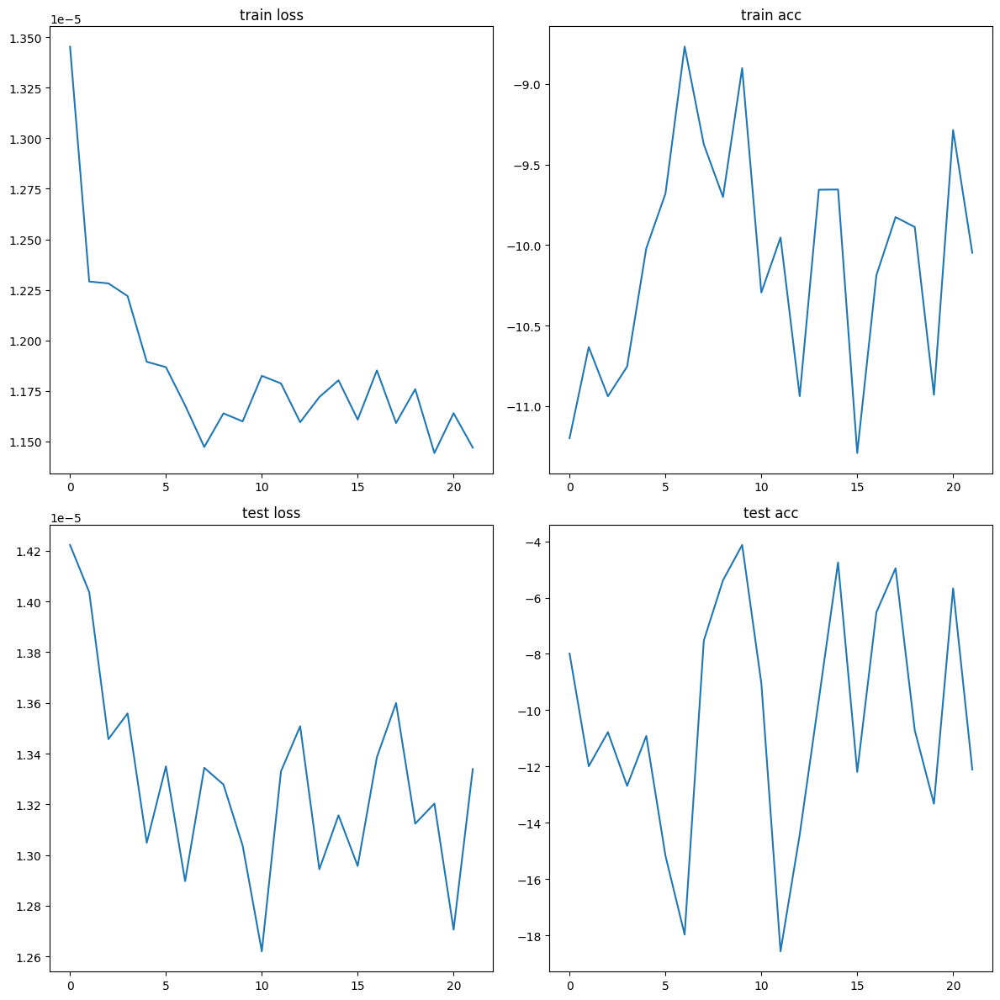

In [ ]:
# plot the loss & accuracy over the course of training
fig, axs = plt.subplots(2, 2, figsize=(12,12))
axs[0,0].plot(train_losses)
axs[0,0].set_title('train loss')
axs[0,1].plot(train_accs)
axs[0,1].set_title('train acc')
axs[1,0].plot(test_losses)
axs[1,0].set_title('test loss')
axs[1,1].plot(test_accs)
axs[1,1].set_title('test acc')
plt.tight_layout()
plt.show()

# TESTING:


In [ ]:
import torch
import torchaudio
import torch.nn.functional as F
import torchaudio.transforms as T
from transformers import SamModel, SamConfig
from segsep.utils import should_skip_chunk

# --------------------------------------------------------------------------------------------------
class _SamWrapper(torch.nn.Module):
  def __init__(self,
               spec_dim=(1024, 1024),
               sample_rate=44100,
               resample_rate=22050,
               saved_model_state_dict=None):
    super().__init__()

    self.spec_dim = spec_dim
    self.n_fft = 2*(self.spec_dim[1]-1)
    self.win_length = self.n_fft
    self.hop_length = self.n_fft//8
    self.sample_rate = sample_rate
    self.resample_rate = resample_rate
    self.downsampler = T.Resample(orig_freq=self.sample_rate, new_freq=self.resample_rate)
    self.upsampler = T.Resample(orig_freq=self.resample_rate, new_freq=self.sample_rate)
    self.input_chunk_size = (self.sample_rate / self.resample_rate) * (self.spec_dim[0]-1) * self.hop_length

    if not self.input_chunk_size.is_integer():
      print(f"WARNING, noninteger input chunk size, choose your sample rate, resample rate to divide cleanly!")
    print(f"SamWrapper model n_fft: {self.n_fft}, win len: {self.win_length}, hop len: {self.hop_length}, sample/resample: {self.sample_rate / self.resample_rate} -> input_chunk_size {self.input_chunk_size}")

    self.input_chunk_size = int(self.input_chunk_size)

    if saved_model_state_dict == None:
      self.sam_model = SamModel.from_pretrained("facebook/sam-vit-base")
    else:
      config = SamConfig() # dummy config
      self.sam_model = SamModel(config)
      self.sam_model.load_state_dict(saved_model_state_dict)


  # ---------------------------------------------------------------
  def encoder(self, x): # returns magnitude spectrum, phase spectrum
    x = self.downsampler(x)
    sample_cnt = x.shape[-1]
    ideal_hop_length = sample_cnt / (self.spec_dim[0] - 1)

    if not ideal_hop_length.is_integer():
      print(f"WARNING, choose audio chunk size to be integer multiple of hop_length {self.hop_length}! != {ideal_hop_length}")

    X = torch.stft( input=x,
                    n_fft=self.n_fft,
                    win_length=self.win_length,
                    window=torch.hann_window(self.win_length).to(x.device),
                    center=True,
                    hop_length=self.hop_length,
                    onesided=True,
                    return_complex=True)

    return X

  # ---------------------------------------------------------------
  def decoder(self, X): #takes complex spectrum, returns audio
    x = torch.istft( input=X,
                    n_fft=self.n_fft,
                    win_length=self.win_length,
                    window=torch.hann_window(self.win_length).to(X.device),
                    center=True,
                    hop_length=self.hop_length,
                    onesided=True,
                    return_complex=False)
    x = self.upsampler(x)
    return x

  # ---------------------------------------------------------------
  # returns predicted vocals:
  def forward(self,
              audio_in,
              input_points=None,
              input_boxes=None,
              upscale_mask=False,
              debug=False):
    # normalize the audio
    mean = torch.mean(audio_in)
    std = torch.std(audio_in)
    audio_in = (audio_in - mean) / (std + 1e-8)

    if torch.isnan(audio_in).any():
      print("forward(): input audio contains nan after normalization!!!")

    # get the magnitude and phase spectra from the encoder (STFT)
    X = self.encoder(audio_in)
    input_spec_shape = X.shape

    mix_spec_in = torch.abs(X)
    phase_in = torch.angle(X)

    if debug:
      print(f"forward(): mix_spec {mix_spec_in.shape}, phase_in {phase_in.shape}")
    # make sure the tensors are in the correct shape for the backbone : 1024,1024
    if(mix_spec_in.shape[0] != 1024 or mix_spec_in.shape[1] != 1024):
      if debug:
        print(f"forward(): interpolating input mix spec from {mix_spec_in.shape} to (3,1024,1024)")
      mix_spec_in = torch.nn.functional.interpolate(mix_spec_in.unsqueeze(0), size=(1024,1024), mode='bilinear').squeeze(0)
    outputs = self.sam_model(pixel_values=mix_spec_in.unsqueeze(0),
                             input_points=input_points,
                             input_boxes=input_boxes,
                             multimask_output=True)

    #print(f"sam_model iou_scores: {outputs.iou_scores.shape}; {outputs.iou_scores}")
    #img_embeddings = self.sam_model.vision_encoder(mix_spec_in.unsqueeze(0))
    #print(f"img_embeddings.last_hidden_state.shap: {img_embeddings.last_hidden_state.shape}")
    #mask = self.sam_model.mask_decoder(img_embeddings.last_hidden_state)
    #print(f"mask decoder output: {mask}")

    pred_masks = outputs.pred_masks.squeeze(1)
    if debug:
      print(f"forward(): sam_model outputs pred_masks shape: {outputs.pred_masks.shape}; pred_masks.shape: {pred_masks.shape}")


    if upscale_mask:
      upscale_size = (mix_spec_in.shape[1], mix_spec_in.shape[2])
      pred_masks = torch.nn.functional.interpolate(pred_masks, size=upscale_size, mode='bilinear')
      # filter the predicted mask with the original mix spectrum magnitude
      if debug:
        print(f"forward(): multiplying pred mask {pred_masks.shape} and mix spec {mix_spec_in.shape}")
      pred_mag = torch.mul(pred_masks, mix_spec_in)
      if debug:
        print(f"forward(): upscaling predicted mask from {pred_masks.shape} to {pred_masks.shape}")

    else: #downscale the mix_spec_in to pred_mag's size
      kernel_size = (2,2) # ...first do a average pooling
      mix_spec_avg_pool = torch.nn.functional.avg_pool2d(mix_spec_in, kernel_size)
      downscale_size = (pred_masks.shape[2], pred_masks.shape[3])

      downscaled_mix_spec = torch.nn.functional.interpolate(mix_spec_in.unsqueeze(0), size=downscale_size, mode='bilinear').squeeze(0)

      if debug:
        print(f"forward(): downscaling mix spec from {mix_spec_in.shape} -> avg pool {mix_spec_avg_pool.shape} -> interpolate {downscaled_mix_spec.shape}")

      pred_mag = torch.mul(pred_masks, downscaled_mix_spec)

    # resynthesize the estimated source audio
    if pred_mag.squeeze().shape != input_spec_shape:
      if debug:
        print(f"forward(): resizing predicted mag spec from {pred_mag.shape} to {input_spec_shape}")
      pred_mag = torch.nn.functional.interpolate(pred_mag, size=(input_spec_shape[1], input_spec_shape[2]), mode='bilinear')

    pred = (pred_mag * torch.cos(phase_in)) + (1.0j * pred_mag * torch.sin(phase_in))

    if debug:
      print(f"forward(): predicted spectrum shape: {pred.shape}")
    pred_audio = self.decoder(pred.squeeze())
    return pred_audio, mix_spec_in, phase_in, pred_mag, pred_masks.squeeze(), outputs.iou_scores.squeeze()

In [ ]:
del model
torch.cuda.empty_cache()

In [ ]:
device = "cpu"

In [ ]:
model = _SamWrapper(spec_dim=(256,256),
                   sample_rate=44100,
                   resample_rate=22050,
                   saved_model_state_dict=None).to(device)

SamWrapper model n_fft: 510, win len: 510, hop len: 63, sample/resample: 2.0 -> input_chunk_size 32130.0


In [ ]:
x = torch.rand(3, model.input_chunk_size)
pred_audio, mix_spec_in, phase_in, pred_mag, upscaled_pred_mask, iou_scores = model(x.to(device), upscale_mask=False, debug=True)

forward(): mix_spec torch.Size([3, 256, 256]), phase_in torch.Size([3, 256, 256])
forward(): interpolating input mix spec from torch.Size([3, 256, 256]) to (3,1024,1024)
forward(): sam_model outputs pred_masks shape: torch.Size([1, 1, 3, 256, 256]); pred_masks.shape: torch.Size([1, 3, 256, 256])
forward(): downscaling mix spec from torch.Size([3, 1024, 1024]) -> avg pool torch.Size([3, 512, 512]) -> interpolate torch.Size([3, 256, 256])
forward(): predicted spectrum shape: torch.Size([1, 3, 256, 256])
